In [1]:
import pandas as pd
import datetime
import ta
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
import plotly.express as px
import numpy as np
from scipy import stats
from scipy.stats import linregress, pearsonr
from scipy.stats import f
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Historical Trend of Copper/Aluminum

In [2]:
copper_monthly = pd.read_csv("resources/copper_monthly.csv")
alu_monthly = pd.read_csv("resources/alu_monthly.csv")

In [3]:
copper_monthly.head()

,date,value
0,2024-11-01,9075.72714285714
1,2024-10-01,9533.99130434783
2,2024-09-01,9259.12857142857
3,2024-08-01,8981.11772727273
4,2024-07-01,9385.31304347826


In [4]:
copper_monthly = copper_monthly.rename(columns = {"value":"copper_value"})
copper_monthly.head()

,date,copper_value
0,2024-11-01,9075.72714285714
1,2024-10-01,9533.99130434783
2,2024-09-01,9259.12857142857
3,2024-08-01,8981.11772727273
4,2024-07-01,9385.31304347826


In [5]:
alu_monthly.head()

,date,value
0,2024-11-01,2582.18857142857
1,2024-10-01,2595.58304347826
2,2024-09-01,2457.4780952381
3,2024-08-01,2352.46727272727
4,2024-07-01,2349.1252173913


In [6]:
alu_monthly = alu_monthly.rename(columns = {"value":"alu_value"})

In [7]:
alu_monthly = alu_monthly.drop(columns=['date'], axis=1)

In [8]:
combined_monthly = pd.concat([copper_monthly, alu_monthly], axis=1)
combined_monthly.head()

,date,copper_value,alu_value
0,2024-11-01,9075.72714285714,2582.18857142857
1,2024-10-01,9533.99130434783,2595.58304347826
2,2024-09-01,9259.12857142857,2457.4780952381
3,2024-08-01,8981.11772727273,2352.46727272727
4,2024-07-01,9385.31304347826,2349.1252173913


In [9]:
combined_monthly.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 539 entries, 0 to 538
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   date          539 non-null    object
 1   copper_value  539 non-null    object
 2   alu_value     539 non-null    object
dtypes: object(3)
memory usage: 12.8+ KB


In [10]:
combined_monthly['copper_value'] = pd.to_numeric(combined_monthly['copper_value'], errors='coerce')
combined_monthly['alu_value'] = pd.to_numeric(combined_monthly['alu_value'], errors='coerce')

combined_monthly['date'] = pd.to_datetime(combined_monthly['date'])


In [11]:
combined_monthly.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 539 entries, 0 to 538
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          539 non-null    datetime64[ns]
 1   copper_value  419 non-null    float64       
 2   alu_value     419 non-null    float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 12.8 KB


In [12]:
combined_monthly = combined_monthly.dropna()
combined_monthly.tail()

,date,copper_value,alu_value
414,1990-05-01,2740.342391,1527.0
415,1990-04-01,2685.226891,1526.0
416,1990-03-01,2625.702723,1567.0
417,1990-02-01,2358.943400,1454.0
418,1990-01-01,2365.556991,1528.0


In [13]:
# Correlation between copper and aluminium (starting from 1990 Jan - 2024 Nov) 
corr_matrix = combined_monthly.drop(columns=['date']).corr()
corr_matrix

,copper_value,alu_value
copper_value,1.000000,0.846464
alu_value,0.846464,1.000000


In [14]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=combined_monthly['date'], y=combined_monthly['copper_value'], mode='lines', name='Global Copper Price'))
fig.add_trace(go.Scatter(x=combined_monthly['date'], y=combined_monthly['alu_value'], mode='lines', name='Global Aluminium Price'))

fig.update_layout(
    title='Global Copper & Aluminium Price (From 1990-Jan to 2024-Nov)',
    xaxis_title='Date',
    yaxis_title='Monthly Price (USD/Metric Ton)',
    legend=dict(x=1, y=1),
    template='plotly_white',
)

fig.show()

# 2. Consumer Price Index (CPI)
---
- **2.1 Comparison of CPI and PCE measures**
- **2.2 CPI v.s. Copper/Aluminum**

In [15]:
cpi_df = pd.read_csv("resources/fredgraph_2014Nov_2024Nov.csv")

In [16]:
cpi_df.head()

,observation_date,CPIAUCSL_PC1,CPILFESL_PC1,CPIENGSL_PC1,CUSR0000SACE_PC1,CUSR0000SEHF_PC1,PCEPI_PC1
0,2014-11-01,1.23152,1.74159,-5.64523,-11.36293,2.86334,1.08576
1,2014-12-01,0.65312,1.62242,-11.06770,-20.82224,3.71750,0.73226
2,2015-01-01,-0.22993,1.63163,-20.13821,-34.59511,1.66763,0.04140
3,2015-02-01,-0.08703,1.68808,-18.76723,-31.93502,0.81750,0.17070
4,2015-03-01,-0.02203,1.74538,-17.68436,-28.07911,-2.93954,0.19935


In [17]:
# 10-year CPI data
cpi_df = cpi_df.iloc[1:].reset_index(drop=True)
cpi_df

,observation_date,CPIAUCSL_PC1,CPILFESL_PC1,CPIENGSL_PC1,CUSR0000SACE_PC1,CUSR0000SEHF_PC1,PCEPI_PC1
0,2014-12-01,0.65312,1.62242,-11.06770,-20.82224,3.71750,0.73226
1,2015-01-01,-0.22993,1.63163,-20.13821,-34.59511,1.66763,0.04140
2,2015-02-01,-0.08703,1.68808,-18.76723,-31.93502,0.81750,0.17070
3,2015-03-01,-0.02203,1.74538,-17.68436,-28.07911,-2.93954,0.19935
4,2015-04-01,-0.10403,1.80283,-18.52488,-30.25245,-1.26697,0.11032
...,...,...,...,...,...,...,...
115,2024-07-01,2.92357,3.21319,0.96254,-2.07931,4.12569,2.46853
116,2024-08-01,2.59123,3.26556,-4.01051,-10.15275,3.03405,2.28331
117,2024-09-01,2.40751,3.25871,-6.85852,-15.31385,3.35753,2.10237
118,2024-10-01,2.57633,3.30004,-4.84854,-12.39927,4.00513,2.30767


In [18]:
cpi_df = cpi_df.rename(columns = {"CPIAUCSL_PC1":"CPI_all_items","PCEPI_PC1":"PCE",
                                  "CPIENGSL_PC1":"CPI_Energy",
                                  "CUSR0000SACE_PC1":"CPI_Energy_Commo","CUSR0000SEHF_PC1":"CPI_Energy_Ser",
                                  "CPIENGSL_PC1":"CPI_Energy",
                                  "observation_date":"Date","CPILFESL_PC1":"CPI_excl_food_energy"})

cpi_df['Date'] = pd.to_datetime(cpi_df['Date'])

cpi_df.head()

,Date,CPI_all_items,CPI_excl_food_energy,CPI_Energy,CPI_Energy_Commo,CPI_Energy_Ser,PCE
0,2014-12-01,0.65312,1.62242,-11.06770,-20.82224,3.71750,0.73226
1,2015-01-01,-0.22993,1.63163,-20.13821,-34.59511,1.66763,0.04140
2,2015-02-01,-0.08703,1.68808,-18.76723,-31.93502,0.81750,0.17070
3,2015-03-01,-0.02203,1.74538,-17.68436,-28.07911,-2.93954,0.19935
4,2015-04-01,-0.10403,1.80283,-18.52488,-30.25245,-1.26697,0.11032


In [19]:
cpi_df.to_csv("outputs/cpi_2014Dec_2024Nov.csv", index=False)

## 2.1 Comparison of CPI and PCE measures

In [20]:
legend_labels = {
    'CPI_all_items': 'Headline CPI',
    'CPI_excl_food_energy': 'Core CPI',
    'PCE': 'PCE',
    'CPI_Energy': 'Energy CPI',
    'CPI_Energy_Commo': 'CPI - Energy Commodities',
    'CPI_Energy_Ser': 'CPI - Energy Services',
}

fig = go.Figure()


columns_to_plot = ['CPI_all_items','CPI_excl_food_energy', 'PCE', 'CPI_Energy', 'CPI_Energy_Commo', 'CPI_Energy_Ser']

for column in columns_to_plot:
    fig.add_trace(go.Scatter(
        x=cpi_df['Date'],
        y=cpi_df[column],
        mode='lines',
        name=legend_labels.get(column, column),
        line=dict(
            width=4 if column == 'CPI_all_items' else 2,

        ),
        opacity=1.0 if column == 'CPI_all_items' else 0.6 
    ))

# Customize layout
fig.update_layout(
    title='Comparison of CPI and PCE Measures',
    xaxis_title='Date',
    yaxis_title='Year-over-Year % Change',
    showlegend=True,
    template='plotly_white'
)


fig.show()

In [21]:
cpi_df.tail(10)

,Date,CPI_all_items,CPI_excl_food_energy,CPI_Energy,CPI_Energy_Commo,CPI_Energy_Ser,PCE
110,2024-02-01,3.16574,3.76195,-1.74299,-4.10113,0.53216,2.59043
111,2024-03-01,3.47513,3.79729,2.13220,0.91260,3.07114,2.80963
112,2024-04-01,3.35773,3.61553,2.52511,1.07334,3.53017,2.72068
113,2024-05-01,3.25021,3.41106,3.51582,2.10982,4.65857,2.56701
114,2024-06-01,2.97563,3.27694,0.91422,-2.27672,4.25582,2.43617
115,2024-07-01,2.92357,3.21319,0.96254,-2.07931,4.12569,2.46853
116,2024-08-01,2.59123,3.26556,-4.01051,-10.15275,3.03405,2.28331
117,2024-09-01,2.40751,3.25871,-6.85852,-15.31385,3.35753,2.10237
118,2024-10-01,2.57633,3.30004,-4.84854,-12.39927,4.00513,2.30767
119,2024-11-01,2.73258,3.30015,-3.14935,-8.45783,2.83076,2.44368


In [22]:
stats_cpi_df = cpi_df.describe()
stats_cpi_df

,CPI_all_items,CPI_excl_food_energy,CPI_Energy,CPI_Energy_Commo,CPI_Energy_Ser,PCE
count,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000
mean,2.861575,2.973679,2.230618,2.496703,2.954505,2.433061
std,2.291812,1.517658,14.094853,23.079970,5.731737,1.900428
min,-0.229930,1.179880,-20.138210,-34.595110,-4.806550,0.041400
25%,1.389595,1.887878,-7.894140,-15.416710,-0.515045,1.254255
50%,2.222020,2.240435,0.105895,-0.900750,1.355120,1.815660
75%,3.331803,3.920237,8.615482,14.429285,4.158222,3.061110
max,8.989740,6.640450,41.563290,60.663670,19.939010,7.248870


In [23]:
std_cpi_energy = stats_cpi_df.loc['std','CPI_Energy']
std_energy_comm = stats_cpi_df.loc['std','CPI_Energy_Commo']
std_energy_ser = stats_cpi_df.loc['std','CPI_Energy_Ser']
std_headline_cpi = stats_cpi_df.loc['std','CPI_all_items']


var_cpi_energy = std_cpi_energy ** 2
var_headline_cpi = std_headline_cpi ** 2


perc_commodities = (std_energy_comm ** 2 / var_cpi_energy) * 100
perc_services = (std_energy_ser ** 2 / var_cpi_energy) * 100


print(f"Total Variance of CPI Energy: {var_cpi_energy:.3f}")
print(f"Variance of Energy Commodities: {std_energy_comm ** 2:.3f}")
print(f"Variance of Energy Services: {std_energy_ser ** 2:.3f}")
print(f"Percentage Contribution of Energy Commodities: {perc_commodities:.2f}%")
print(f"Percentage Contribution of Energy Services: {perc_services:.2f}%")
print(f"Total Variance of Headline CPI: {var_headline_cpi:.3f}")

Total Variance of CPI Energy: 198.665
Variance of Energy Commodities: 532.685
Variance of Energy Services: 32.853
Percentage Contribution of Energy Commodities: 268.13%
Percentage Contribution of Energy Services: 16.54%
Total Variance of Headline CPI: 5.252


## 2.2 CPI v.s. Copper/Aluminum (Past Decade)
---
- Headline CPI
- Core CPI
- Energy CPI,Energy Service CPI, Energy Commodities CPI
- Personal Consumption Expenditure (PCE)

In [24]:
f_combined_monthly = combined_monthly[(combined_monthly['date'] >= '2014-12-01')&
                                  (combined_monthly['date'] <= '2024-11-01')]

f_combined_monthly.head()

,date,copper_value,alu_value
0,2024-11-01,9075.727143,2582.188571
1,2024-10-01,9533.991304,2595.583043
2,2024-09-01,9259.128571,2457.478095
3,2024-08-01,8981.117727,2352.467273
4,2024-07-01,9385.313043,2349.125217


In [25]:
f_combined_monthly = f_combined_monthly.sort_values(by="date",ascending = True).reset_index(drop=True)
f_combined_monthly.head()

,date,copper_value,alu_value
0,2014-12-01,6446.452381,1909.459524
1,2015-01-01,5830.535714,1814.719048
2,2015-02-01,5729.275000,1817.820000
3,2015-03-01,5939.670455,1773.863636
4,2015-04-01,6042.087500,1819.187500


In [26]:
def add_trendline(x, y):
    slope, intercept, _, _, _ = linregress(x, y)
    return slope * x + intercept

In [27]:
def plot_comm_vs_cpi(comm_value, comm_label, cpi_value, cpi_label, cpi_df, f_combined_monthly):
    
    fig = go.Figure()


    fig.add_trace(go.Scatter(
        x=f_combined_monthly['date'], 
        y=f_combined_monthly[comm_value], 
        mode='markers', 
        name=comm_label
    ))


    fig.add_trace(go.Scatter(
        x=f_combined_monthly['date'], 
        y=cpi_df[cpi_value], 
        mode='lines', 
        name=cpi_label, 
        yaxis='y2'
    ))


    f_combined_monthly['date_num'] = f_combined_monthly['date'].map(pd.Timestamp.toordinal)
    
    comm_trendline = add_trendline(f_combined_monthly['date_num'], f_combined_monthly[comm_value])
    fig.add_trace(go.Scatter(
        x=f_combined_monthly['date'], 
        y=comm_trendline, 
        mode='lines', 
        name=f'{comm_label} Trendline', 
        line=dict(dash='dash', color='blue')
    ))

    
    cpi_trendline = add_trendline(f_combined_monthly['date_num'], cpi_df[cpi_value])
    fig.add_trace(go.Scatter(
        x=f_combined_monthly['date'], 
        y=cpi_trendline, 
        mode='lines', 
        name=f'{cpi_label} Trendline', 
        line=dict(dash='dash', color='red'),
        yaxis='y2'
    ))
    

    fig.update_layout(
        title=f'{comm_label} with {cpi_label} (From Dec-2014 to Nov-2024)',
        xaxis_title='Date',
        yaxis=dict(
            title=f'{comm_label}(USD/Metric Ton)',
            titlefont=dict(color='blue'),
            tickfont=dict(color='blue'),
        ),
        yaxis2=dict(
            title=f'{cpi_label}(YoY % Change)',
            titlefont=dict(color='red'),
            tickfont=dict(color='red'),
            overlaying='y',
            side='right'
        ),
        legend=dict(x=1.1, y=1),template='plotly_white',
    )

    
    fig.show()

    
    correlation, _ = pearsonr(cpi_df[cpi_value], f_combined_monthly[comm_value])
    print(f"Quick Summary")
    print(f"--------------")
    print(f"The Pearson correlation between {comm_label} and {cpi_label} is: {round(correlation, 3)}")

In [28]:
plot_comm_vs_cpi(
    comm_value='copper_value', 
    comm_label='Global Monthly Copper Price',
    cpi_value='CPI_all_items', 
    cpi_label='Headline CPI',
    cpi_df=cpi_df, 
    f_combined_monthly=f_combined_monthly
)

Quick Summary
--------------
The Pearson correlation between Global Monthly Copper Price and Headline CPI is: 0.735


In [29]:
plot_comm_vs_cpi(
    comm_value='alu_value', 
    comm_label='Global Monthly Aluminum Price',
    cpi_value='CPI_all_items', 
    cpi_label='Headline CPI',
    cpi_df=cpi_df, 
    f_combined_monthly=f_combined_monthly
)

Quick Summary
--------------
The Pearson correlation between Global Monthly Aluminum Price and Headline CPI is: 0.83


In [30]:
plot_comm_vs_cpi(
    comm_value='copper_value', 
    comm_label='Global Monthly Copper Price',
    cpi_value='CPI_Energy', 
    cpi_label='Energy CPI',
    cpi_df=cpi_df, 
    f_combined_monthly=f_combined_monthly
)

Quick Summary
--------------
The Pearson correlation between Global Monthly Copper Price and Energy CPI is: 0.583


In [31]:
plot_comm_vs_cpi(
    comm_value='alu_value', 
    comm_label='Global Monthly Aluminum Price',
    cpi_value='CPI_Energy', 
    cpi_label='Energy CPI',
    cpi_df=cpi_df, 
    f_combined_monthly=f_combined_monthly
)

Quick Summary
--------------
The Pearson correlation between Global Monthly Aluminum Price and Energy CPI is: 0.734


In [32]:
plot_comm_vs_cpi(
    comm_value='copper_value', 
    comm_label='Global Monthly Copper Price',
    cpi_value='CPI_Energy_Commo', 
    cpi_label='Energy Commodities CPI',
    cpi_df=cpi_df, 
    f_combined_monthly=f_combined_monthly
)

Quick Summary
--------------
The Pearson correlation between Global Monthly Copper Price and Energy Commodities CPI is: 0.545


In [33]:
plot_comm_vs_cpi(
    comm_value='copper_value', 
    comm_label='Global Monthly Copper Price',
    cpi_value='CPI_Energy_Ser', 
    cpi_label='Energy Service CPI',
    cpi_df=cpi_df, 
    f_combined_monthly=f_combined_monthly
)

Quick Summary
--------------
The Pearson correlation between Global Monthly Copper Price and Energy Service CPI is: 0.623


# 3. Correlation - CPI v.s. Copper/Aluminum
---  
- **Hypothesis Testing**: Significant correlations across the following periods:  
    - **3.1 Past Decade**: Dec 2014 – Nov 2024  
    - **3.2 COVID-19 Period**: Mar 2020 – May 2023  
    - **3.3 Post-COVID Period**: Jun 2023 – Nov 2024  

In [34]:
csi_df = pd.read_csv("resources/csi_2014Nov_2024Nov.csv")
csi_df.head()

,observation_date,UMCSENT_PC1
0,2014-11-01,18.24234
1,2014-12-01,13.45455
2,2015-01-01,20.81281
3,2015-02-01,16.91176
4,2015-03-01,16.25000


In [35]:
#10-year data
csi_df = csi_df.iloc[1:].reset_index(drop=True)
csi_df

,observation_date,UMCSENT_PC1
0,2014-12-01,13.45455
1,2015-01-01,20.81281
2,2015-02-01,16.91176
3,2015-03-01,16.25000
4,2015-04-01,14.03092
...,...,...
115,2024-07-01,-7.13287
116,2024-08-01,-2.16138
117,2024-09-01,3.39233
118,2024-10-01,10.50157


In [36]:
csi_df = csi_df.rename(columns = {"UMCSENT_PC1":"CSI"})
csi_df.head()

,observation_date,CSI
0,2014-12-01,13.45455
1,2015-01-01,20.81281
2,2015-02-01,16.91176
3,2015-03-01,16.25000
4,2015-04-01,14.03092


In [37]:
cpi_cop_alu_df = pd.concat([cpi_df, csi_df,f_combined_monthly], axis=1).reset_index(drop=True)
cpi_cop_alu_df.head()

,Date,CPI_all_items,CPI_excl_food_energy,CPI_Energy,CPI_Energy_Commo,CPI_Energy_Ser,PCE,observation_date,CSI,date,copper_value,alu_value,date_num
0,2014-12-01,0.65312,1.62242,-11.06770,-20.82224,3.71750,0.73226,2014-12-01,13.45455,2014-12-01,6446.452381,1909.459524,735568
1,2015-01-01,-0.22993,1.63163,-20.13821,-34.59511,1.66763,0.04140,2015-01-01,20.81281,2015-01-01,5830.535714,1814.719048,735599
2,2015-02-01,-0.08703,1.68808,-18.76723,-31.93502,0.81750,0.17070,2015-02-01,16.91176,2015-02-01,5729.275000,1817.820000,735630
3,2015-03-01,-0.02203,1.74538,-17.68436,-28.07911,-2.93954,0.19935,2015-03-01,16.25000,2015-03-01,5939.670455,1773.863636,735658
4,2015-04-01,-0.10403,1.80283,-18.52488,-30.25245,-1.26697,0.11032,2015-04-01,14.03092,2015-04-01,6042.087500,1819.187500,735689


In [38]:
cpi_cop_alu_df = cpi_cop_alu_df.drop(columns=['date','observation_date','date_num'])
cpi_cop_alu_df.head()

,Date,CPI_all_items,CPI_excl_food_energy,CPI_Energy,CPI_Energy_Commo,CPI_Energy_Ser,PCE,CSI,copper_value,alu_value
0,2014-12-01,0.65312,1.62242,-11.06770,-20.82224,3.71750,0.73226,13.45455,6446.452381,1909.459524
1,2015-01-01,-0.22993,1.63163,-20.13821,-34.59511,1.66763,0.04140,20.81281,5830.535714,1814.719048
2,2015-02-01,-0.08703,1.68808,-18.76723,-31.93502,0.81750,0.17070,16.91176,5729.275000,1817.820000
3,2015-03-01,-0.02203,1.74538,-17.68436,-28.07911,-2.93954,0.19935,16.25000,5939.670455,1773.863636
4,2015-04-01,-0.10403,1.80283,-18.52488,-30.25245,-1.26697,0.11032,14.03092,6042.087500,1819.187500


In [39]:
cpi_cop_alu_df.to_csv("outputs/full_cpi_CoppAlu_2014Dec_2024Nov.csv", index=False)

## 3.1 Past Decade: November 2014 – November 2024
--- 
- hypothesis test (Pearson correlation)
- correlation differences

In [40]:
corr_matrix_10yrs = cpi_cop_alu_df.drop(columns=['Date']).corr()
corr_matrix_10yrs

,CPI_all_items,CPI_excl_food_energy,CPI_Energy,CPI_Energy_Commo,CPI_Energy_Ser,PCE,CSI,copper_value,alu_value
CPI_all_items,1.000000,0.923660,0.834369,0.765310,0.886510,0.994797,-0.364491,0.735012,0.830011
CPI_excl_food_energy,0.923660,1.000000,0.581893,0.502767,0.767040,0.932039,-0.205439,0.716605,0.761807
CPI_Energy,0.834369,0.581893,1.000000,0.987640,0.760350,0.809396,-0.340937,0.583258,0.733656
CPI_Energy_Commo,0.765310,0.502767,0.987640,1.000000,0.657860,0.739968,-0.267183,0.545280,0.691778
CPI_Energy_Ser,0.886510,0.767040,0.760350,0.657860,1.000000,0.881798,-0.479249,0.623328,0.720082
PCE,0.994797,0.932039,0.809396,0.739968,0.881798,1.000000,-0.347591,0.765703,0.843505
CSI,-0.364491,-0.205439,-0.340937,-0.267183,-0.479249,-0.347591,1.000000,-0.048752,-0.158242
copper_value,0.735012,0.716605,0.583258,0.545280,0.623328,0.765703,-0.048752,1.000000,0.910444
alu_value,0.830011,0.761807,0.733656,0.691778,0.720082,0.843505,-0.158242,0.910444,1.000000


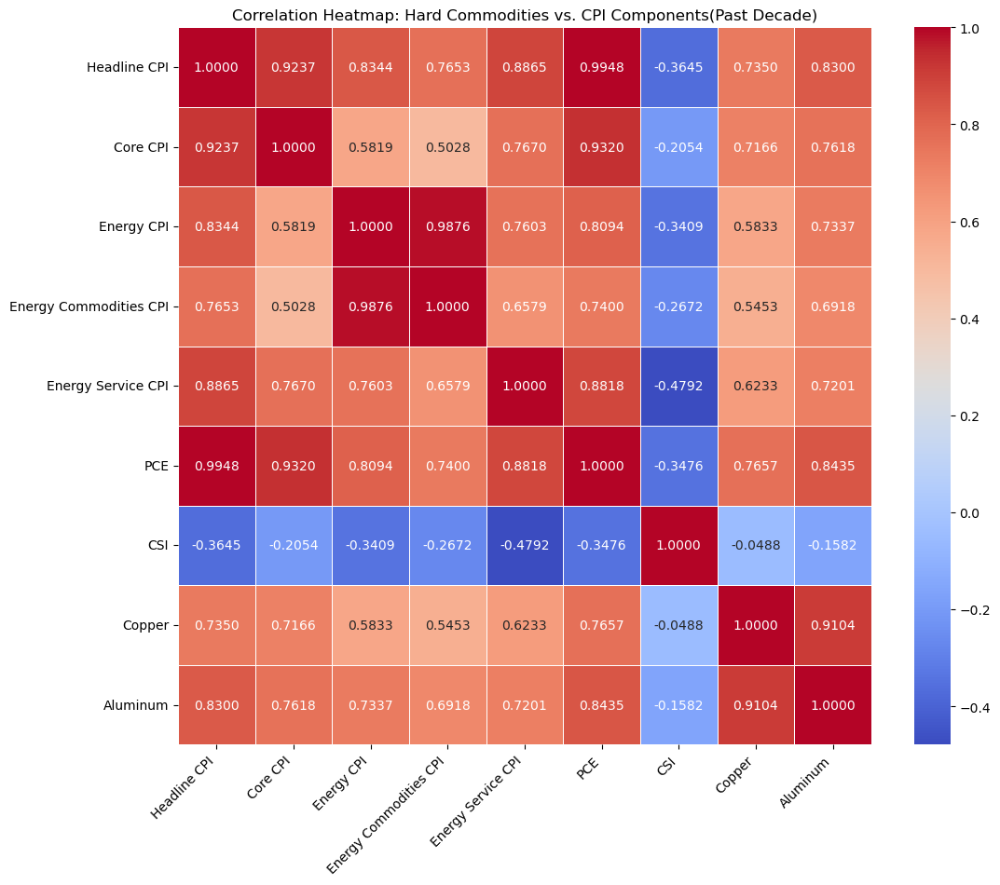

In [41]:
plt.figure(figsize=(12, 10))
heatmap = sns.heatmap(corr_matrix_10yrs, annot=True, fmt=".4f", cmap='coolwarm', linewidths=0.5)

tick_labels = ["Headline CPI","Core CPI","Energy CPI", "Energy Commodities CPI", "Energy Service CPI", 
               "PCE","CSI","Copper","Aluminum"]
heatmap.set_xticklabels(tick_labels, rotation=45,ha='right')
heatmap.set_yticklabels(tick_labels, rotation=0)

plt.title('Correlation Heatmap: Hard Commodities vs. CPI Components(Past Decade)')

plt.savefig('outputs/heatmap_CPI_10yrs.png')

plt.show()

In [42]:
# Correlation difference: Past Decade
corr_cop_energy_comm = corr_matrix_10yrs.loc['CPI_Energy_Commo','copper_value']
corr_cop_energy_ser = corr_matrix_10yrs.loc['CPI_Energy_Ser','copper_value']

corr_alu_energy_comm = corr_matrix_10yrs.loc['CPI_Energy_Commo','alu_value']
corr_alu_energy_ser = corr_matrix_10yrs.loc['CPI_Energy_Ser','alu_value']


corr_diff_cop = corr_cop_energy_ser - corr_cop_energy_comm
corr_diff_alu = corr_alu_energy_ser - corr_alu_energy_comm


print(f"Copper: Correlation difference between Energy Commodities CPI and Energy Service CPI is {corr_diff_cop:.3f}")
print(f"Aluminum: Correlation difference between Energy Commodities CPI and Energy Service CPI is {corr_diff_alu:.3f}")


Copper: Correlation difference between Energy Commodities CPI and Energy Service CPI is 0.078
Aluminum: Correlation difference between Energy Commodities CPI and Energy Service CPI is 0.028


In [43]:
def corr_statsig(correlations, n, alpha=0.05):


    for key, r in correlations.items():

        t_stat = r * np.sqrt(n - 2) / np.sqrt(1 - r**2)
        df = n - 2 
        p_value = 2 * stats.t.sf(np.abs(t_stat), df)
        

        is_significant = p_value < alpha
        

        print(f"{key}:")
        print(f"  Correlation (r): {r:.4f}")
        print(f"  t-statistic: {t_stat:.4f}")
        print(f"  p-value: {p_value:.4f}")
        print(f"  Significant: {'Yes' if is_significant else 'No'}")
        print("-" * 50)

In [44]:
# The lowest: Copper v.s. CPI Energy Commodities
correlations = {'Copper v.s. CPI(Energy Commodities)': 0.545460}

n = len(cpi_cop_alu_df)

corr_statsig(correlations, n)

Copper v.s. CPI(Energy Commodities):
  Correlation (r): 0.5455
  t-statistic: 7.0695
  p-value: 0.0000
  Significant: Yes
--------------------------------------------------


In [45]:
cpi_cop_alu_df.loc[cpi_cop_alu_df['copper_value'].idxmax()]

Date                    2022-03-01 00:00:00
CPI_all_items                       8.54743
CPI_excl_food_energy                6.47607
CPI_Energy                         31.77246
CPI_Energy_Commo                    47.8466
CPI_Energy_Ser                     13.37981
PCE                                 6.96708
CSI                               -30.03534
copper_value                   10230.893913
alu_value                       3498.373043
Name: 87, dtype: object

In [46]:
cpi_cop_alu_df.loc[cpi_cop_alu_df['alu_value'].idxmax()]

Date                    2022-03-01 00:00:00
CPI_all_items                       8.54743
CPI_excl_food_energy                6.47607
CPI_Energy                         31.77246
CPI_Energy_Commo                    47.8466
CPI_Energy_Ser                     13.37981
PCE                                 6.96708
CSI                               -30.03534
copper_value                   10230.893913
alu_value                       3498.373043
Name: 87, dtype: object

## 3.2 COVID-19 Period: March 2020 – May 2023
--- 
- hypothesis test (Pearson correlation)
- correlation differences

In [47]:
# "Covid Period" (according to WHO)
cpi_cop_alu_covid = cpi_cop_alu_df[(cpi_cop_alu_df['Date'] >= '2020-03-01')&
                                  (cpi_cop_alu_df['Date'] <= '2023-05-01')].reset_index(drop=True)

corr_matrix_covid = cpi_cop_alu_covid.drop(columns=['Date']).corr()
corr_matrix_covid

,CPI_all_items,CPI_excl_food_energy,CPI_Energy,CPI_Energy_Commo,CPI_Energy_Ser,PCE,CSI,copper_value,alu_value
CPI_all_items,1.000000,0.956405,0.848461,0.767435,0.939450,0.996820,-0.066666,0.698221,0.832711
CPI_excl_food_energy,0.956405,1.000000,0.677621,0.586824,0.884633,0.959655,0.012038,0.625958,0.769189
CPI_Energy,0.848461,0.677621,1.000000,0.986478,0.750679,0.841403,0.006711,0.780440,0.822470
CPI_Energy_Commo,0.767435,0.586824,0.986478,1.000000,0.637275,0.762570,0.087315,0.793251,0.797196
CPI_Energy_Ser,0.939450,0.884633,0.750679,0.637275,1.000000,0.931466,-0.185473,0.539179,0.677815
PCE,0.996820,0.959655,0.841403,0.762570,0.931466,1.000000,-0.032694,0.726751,0.844598
CSI,-0.066666,0.012038,0.006711,0.087315,-0.185473,-0.032694,1.000000,0.331640,0.037906
copper_value,0.698221,0.625958,0.780440,0.793251,0.539179,0.726751,0.331640,1.000000,0.895728
alu_value,0.832711,0.769189,0.822470,0.797196,0.677815,0.844598,0.037906,0.895728,1.000000


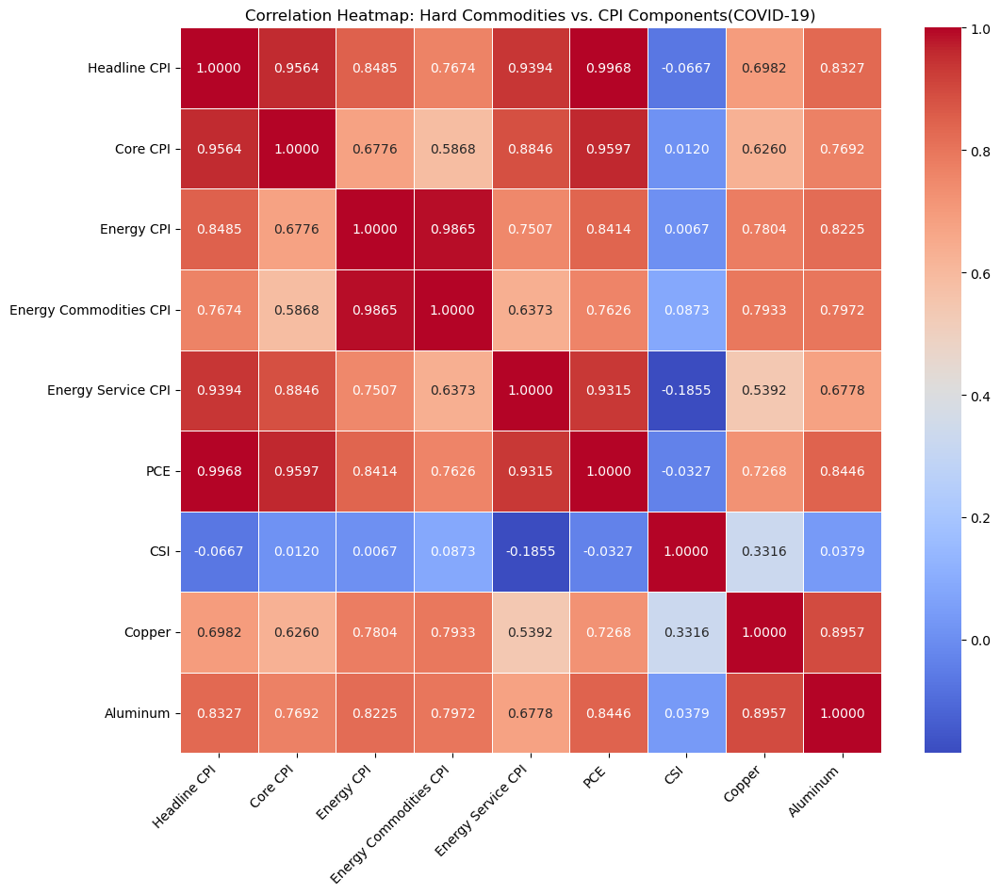

In [48]:
plt.figure(figsize=(12, 10))
heatmap = sns.heatmap(corr_matrix_covid, annot=True,fmt=".4f", cmap='coolwarm', linewidths=0.5)

tick_labels = ["Headline CPI","Core CPI","Energy CPI", "Energy Commodities CPI", "Energy Service CPI", 
               "PCE","CSI","Copper","Aluminum"]
heatmap.set_xticklabels(tick_labels, rotation=45,ha='right')
heatmap.set_yticklabels(tick_labels, rotation=0)

plt.title('Correlation Heatmap: Hard Commodities vs. CPI Components(COVID-19)')

plt.savefig('outputs/heatmap_CPI_covid.png')

plt.show()

In [49]:
# Correlation difference: "Covid Period"

corr_cop_energy_comm = corr_matrix_covid.loc['CPI_Energy_Commo','copper_value']
corr_cop_energy_ser = corr_matrix_covid.loc['CPI_Energy_Ser','copper_value']

corr_alu_energy_comm = corr_matrix_covid.loc['CPI_Energy_Commo','alu_value']
corr_alu_energy_ser = corr_matrix_covid.loc['CPI_Energy_Ser','alu_value']


corr_diff_cop = corr_cop_energy_ser - corr_cop_energy_comm
corr_diff_alu = corr_alu_energy_ser - corr_alu_energy_comm


print(f"Copper: Correlation difference between Energy Commodities CPI and Energy Service CPI is {corr_diff_cop:.3f}")
print(f"Aluminum: Correlation difference between Energy Commodities CPI and Energy Service CPI is {corr_diff_alu:.3f}")


Copper: Correlation difference between Energy Commodities CPI and Energy Service CPI is -0.254
Aluminum: Correlation difference between Energy Commodities CPI and Energy Service CPI is -0.119


In [50]:
print(len(cpi_cop_alu_covid))

39


In [51]:
# The lowest: Copper v.s. CPI Energy Commodities
correlations = {'Copper v.s. CPI(Energy Commodities)': 0.539179}

n = len(cpi_cop_alu_covid)

corr_statsig(correlations, n)

Copper v.s. CPI(Energy Commodities):
  Correlation (r): 0.5392
  t-statistic: 3.8942
  p-value: 0.0004
  Significant: Yes
--------------------------------------------------


## 3.3 Post-COVID Period: June 2023 – November 2024
--- 
- hypothesis test (Spearman Rank Correlation)
- correlation differences

In [52]:
cpi_cop_alu_pcovid = cpi_cop_alu_df[(cpi_cop_alu_df['Date'] >= '2023-06-01')&
                                  (cpi_cop_alu_df['Date'] <= '2024-11-01')].reset_index(drop=True)
cpi_cop_alu_pcovid.head()

,Date,CPI_all_items,CPI_excl_food_energy,CPI_Energy,CPI_Energy_Commo,CPI_Energy_Ser,PCE,CSI,copper_value,alu_value
0,2023-06-01,3.05326,4.85522,-16.67792,-26.92468,-1.12299,3.26157,28.40000,8396.517727,2184.753636
1,2023-07-01,3.27178,4.70760,-12.47732,-20.57423,-1.16982,3.37385,38.83495,8476.679048,2159.732381
2,2023-08-01,3.71872,4.41280,-3.78274,-4.47492,-2.72513,3.38712,19.24399,8347.828261,2135.581739
3,2023-09-01,3.69406,4.14370,-0.61157,2.04875,-3.45737,3.41634,15.69966,8276.713810,2184.673810
4,2023-10-01,3.24579,4.02170,-4.43948,-6.14629,-2.20775,2.99429,6.51085,7941.355909,2194.390909


In [53]:
print(len(cpi_cop_alu_pcovid))

18


In [54]:
#Post Covid Period (Using Spearman)
corr_matrix_postCovid = cpi_cop_alu_pcovid.drop(columns=['Date']).corr(method='spearman')
corr_matrix_postCovid

,CPI_all_items,CPI_excl_food_energy,CPI_Energy,CPI_Energy_Commo,CPI_Energy_Ser,PCE,CSI,copper_value,alu_value
CPI_all_items,1.000000,0.661507,0.384933,0.558308,-0.461300,0.845201,0.541796,-0.391125,-0.562436
CPI_excl_food_energy,0.661507,1.000000,-0.356037,-0.143447,-0.812178,0.905057,0.661507,-0.708978,-0.762642
CPI_Energy,0.384933,-0.356037,1.000000,0.942208,0.453044,-0.038184,-0.060888,0.393189,0.289990
CPI_Energy_Commo,0.558308,-0.143447,0.942208,1.000000,0.238390,0.176471,-0.042312,0.172343,0.108359
CPI_Energy_Ser,-0.461300,-0.812178,0.453044,0.238390,1.000000,-0.725490,-0.364293,0.882353,0.801858
PCE,0.845201,0.905057,-0.038184,0.176471,-0.725490,1.000000,0.626419,-0.614035,-0.739938
CSI,0.541796,0.661507,-0.060888,-0.042312,-0.364293,0.626419,1.000000,-0.135191,-0.320949
copper_value,-0.391125,-0.708978,0.393189,0.172343,0.882353,-0.614035,-0.135191,1.000000,0.777090
alu_value,-0.562436,-0.762642,0.289990,0.108359,0.801858,-0.739938,-0.320949,0.777090,1.000000


In [55]:
def plot_comm_vs_cpi_spearman(comm_value, comm_label, cpi_value, cpi_label, title_period,cpi_cop_alu_pcovid):

    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=cpi_cop_alu_pcovid['Date'], 
        y=cpi_cop_alu_pcovid[comm_value], 
        mode='markers', 
        name=comm_label
    ))

    fig.add_trace(go.Scatter(
        x=cpi_cop_alu_pcovid['Date'], 
        y=cpi_cop_alu_pcovid[cpi_value], 
        mode='lines',
        name=cpi_label, 
        yaxis='y2'
    ))

    cpi_cop_alu_pcovid['date_num'] = cpi_cop_alu_pcovid['Date'].map(pd.Timestamp.toordinal)


    comm_trendline = add_trendline(cpi_cop_alu_pcovid['date_num'], cpi_cop_alu_pcovid[comm_value])
    fig.add_trace(go.Scatter(
        x=cpi_cop_alu_pcovid['Date'], 
        y=comm_trendline, 
        mode='lines', 
        name=f'{comm_label} Trendline', 
        line=dict(dash='dash', color='blue')
    ))


    cpi_trendline = add_trendline(cpi_cop_alu_pcovid['date_num'], cpi_cop_alu_pcovid[cpi_value])
    fig.add_trace(go.Scatter(
        x=cpi_cop_alu_pcovid['Date'], 
        y=cpi_trendline, 
        mode='lines', 
        name=f'{cpi_label} Trendline', 
        line=dict(dash='dash', color='red'),
        yaxis='y2'
    ))


    fig.update_layout(
        title=f'{comm_label} with {cpi_label} ({title_period})',
        xaxis_title='Date',
        yaxis=dict(
            title=comm_label,
            titlefont=dict(color='blue'),
            tickfont=dict(color='blue'),
        ),
        yaxis2=dict(
            title=cpi_label,
            titlefont=dict(color='red'),
            tickfont=dict(color='red'),
            overlaying='y',
            side='right'
        ),
        legend=dict(x=1.1, y=1),template='plotly_white'
    )


    fig.show()


    spearman_corr, p_value = stats.spearmanr(cpi_cop_alu_pcovid[cpi_value], cpi_cop_alu_pcovid[comm_value])

    print(f"Quick Summary")
    print(f"--------------")
    print(f"The Spearman Rank Correlation between {comm_label} and {cpi_label} is: {round(spearman_corr, 3)}")

In [56]:
plot_comm_vs_cpi_spearman(
    comm_value='copper_value', 
    comm_label='Global Monthly Copper Price',
    cpi_value='CPI_all_items', 
    cpi_label='Headline CPI',
    title_period ='From 2023-Jun to 2024-Nov',
    cpi_cop_alu_pcovid=cpi_cop_alu_pcovid, 
)

Quick Summary
--------------
The Spearman Rank Correlation between Global Monthly Copper Price and Headline CPI is: -0.391


In [57]:
def corr_statsig_spearman(x, y, alpha=0.05, label=""):
    
    spearman_corr, p_value = stats.spearmanr(x, y)
    
    is_significant = p_value < alpha
    
    print(f"{label}:")
    print(f"  Correlation (r): {spearman_corr:.4f}")
    print(f"  P-value: {p_value:.4f}")
    print(f"  Significant: {'Yes' if is_significant else 'No'}\n")
    
    return spearman_corr, p_value, is_significant

In [58]:
# Spearman Rank Correlation (Copper v.s. Aluminum)
corr_statsig_spearman(cpi_cop_alu_pcovid['copper_value'],
                      cpi_cop_alu_pcovid['alu_value'],
                      label="Testing: Copper v.s. Aluminum")

Testing: Copper v.s. Aluminum:
  Correlation (r): 0.7771
  P-value: 0.0001
  Significant: Yes



(0.7770897832817338, 0.00014812554588688426, True)

In [59]:
# Copper v.s. CPI
cpi_pce_columns = [
    'CPI_all_items', 'CPI_excl_food_energy', 'CPI_Energy', 
    'CPI_Energy_Commo', 'CPI_Energy_Ser', 'PCE'
]


for col in cpi_pce_columns:
    label = f"Copper v.s. {col}"
    print(f"\nTesting: {label}")
    corr_statsig_spearman(cpi_cop_alu_pcovid[col], cpi_cop_alu_pcovid['copper_value'],label=label)
    print("-" * 50)


Testing: Copper v.s. CPI_all_items
Copper v.s. CPI_all_items:
  Correlation (r): -0.3911
  P-value: 0.1085
  Significant: No

--------------------------------------------------

Testing: Copper v.s. CPI_excl_food_energy
Copper v.s. CPI_excl_food_energy:
  Correlation (r): -0.7090
  P-value: 0.0010
  Significant: Yes

--------------------------------------------------

Testing: Copper v.s. CPI_Energy
Copper v.s. CPI_Energy:
  Correlation (r): 0.3932
  P-value: 0.1065
  Significant: No

--------------------------------------------------

Testing: Copper v.s. CPI_Energy_Commo
Copper v.s. CPI_Energy_Commo:
  Correlation (r): 0.1723
  P-value: 0.4941
  Significant: No

--------------------------------------------------

Testing: Copper v.s. CPI_Energy_Ser
Copper v.s. CPI_Energy_Ser:
  Correlation (r): 0.8824
  P-value: 0.0000
  Significant: Yes

--------------------------------------------------

Testing: Copper v.s. PCE
Copper v.s. PCE:
  Correlation (r): -0.6140
  P-value: 0.0067
  Signi

In [60]:
# Aluminum v.s. CPI
for col in cpi_pce_columns:
    label = f"Aluminum v.s. {col}"
    print(f"\nTesting: {label}")
    corr_statsig_spearman(cpi_cop_alu_pcovid[col], cpi_cop_alu_pcovid['alu_value'], label=label)
    print("-" * 50)


Testing: Aluminum v.s. CPI_all_items
Aluminum v.s. CPI_all_items:
  Correlation (r): -0.5624
  P-value: 0.0151
  Significant: Yes

--------------------------------------------------

Testing: Aluminum v.s. CPI_excl_food_energy
Aluminum v.s. CPI_excl_food_energy:
  Correlation (r): -0.7626
  P-value: 0.0002
  Significant: Yes

--------------------------------------------------

Testing: Aluminum v.s. CPI_Energy
Aluminum v.s. CPI_Energy:
  Correlation (r): 0.2900
  P-value: 0.2431
  Significant: No

--------------------------------------------------

Testing: Aluminum v.s. CPI_Energy_Commo
Aluminum v.s. CPI_Energy_Commo:
  Correlation (r): 0.1084
  P-value: 0.6687
  Significant: No

--------------------------------------------------

Testing: Aluminum v.s. CPI_Energy_Ser
Aluminum v.s. CPI_Energy_Ser:
  Correlation (r): 0.8019
  P-value: 0.0001
  Significant: Yes

--------------------------------------------------

Testing: Aluminum v.s. PCE
Aluminum v.s. PCE:
  Correlation (r): -0.7399


# 4. Cryptocurrencies
---
- **4.1 Interconnections among Cyrptocurrencies (Bitcoin/Ether)**
- **4.2 Cryptocurrencies and Hard Commodities (Copper/Aluminum)**
    - Includes additional analysis on **gold**.
- **4.3 Seasonality**

## 4.1 Interconnections among Cyrptocurrencies
---
- **4.1.1 Overview**
- **4.1.2 Spot Market Analysis**
- **4.1.3 Spot v.s. Futures Market Dynamics**

In [61]:
bitcoin = pd.read_csv("resources/bitcoin_daily.csv")
bitcoin_f = pd.read_csv("resources/bitcoin_daily_f.csv")
eth = pd.read_csv("resources/eth_daily.csv")
eth_f = pd.read_csv("resources/eth_daily_f.csv")

In [62]:
bitcoin_df = bitcoin[['Date', 'Close', 'Volume']].rename(columns={'Close': 'close_b', 'Volume': 'volume_b'})
bitcoin_f_df = bitcoin_f[['Date', 'Close', 'Volume']].rename(columns={'Close': 'close_b_f', 'Volume': 'volume_b_f'})
eth_df = eth[['Date', 'Close', 'Volume']].rename(columns={'Close': 'close_eth', 'Volume': 'volume_eth'})
eth_f_df= eth_f[['Date', 'Close', 'Volume']].rename(columns={'Close': 'close_eth_f','Volume': 'volume_eth_f'})                    

In [63]:
for df in [bitcoin_df, bitcoin_f_df, eth_df, eth_f_df]:
    df['Date'] = pd.to_datetime(df['Date'])

In [64]:
crypto_dataframes = {
    'bitcoin': bitcoin_df,
    'bitcoin_f': bitcoin_f_df,
    'eth': eth_df,
    'eth_f': eth_f_df,
}

crypto_full = crypto_dataframes['bitcoin']
for key in list(crypto_dataframes.keys())[1:]:
    crypto_full = crypto_full.merge(crypto_dataframes[key], on='Date', how='outer')

crypto_full = crypto_full.sort_values(by='Date').reset_index(drop=True)

crypto_full.head()

,Date,close_b,volume_b,close_b_f,volume_b_f,close_eth,volume_eth,close_eth_f,volume_eth_f
0,2014-12-01,379.244995,11763000,NaN,NaN,NaN,NaN,NaN,NaN
1,2014-12-02,381.315002,12364100,NaN,NaN,NaN,NaN,NaN,NaN
2,2014-12-03,375.010010,13340100,NaN,NaN,NaN,NaN,NaN,NaN
3,2014-12-04,369.604004,14529600,NaN,NaN,NaN,NaN,NaN,NaN
4,2014-12-05,376.854004,15181800,NaN,NaN,NaN,NaN,NaN,NaN


### 4.1.1 Overview

In [65]:
# Correlation table: ignoring NA values
corr_crypto_full= crypto_full.drop(columns=['Date']).corr()
corr_crypto_full

,close_b,volume_b,close_b_f,volume_b_f,close_eth,volume_eth,close_eth_f,volume_eth_f
close_b,1.000000,0.650113,0.999759,0.369283,0.912012,0.547714,0.771006,-0.107059
volume_b,0.650113,1.000000,0.518842,0.553870,0.351302,0.868551,0.189968,0.214849
close_b_f,0.999759,0.518842,1.000000,0.369564,0.910628,0.578504,0.772002,-0.106445
volume_b_f,0.369283,0.553870,0.369564,1.000000,0.283166,0.495602,-0.069005,0.664195
close_eth,0.912012,0.351302,0.910628,0.283166,1.000000,0.476170,0.998875,-0.057463
volume_eth,0.547714,0.868551,0.578504,0.495602,0.476170,1.000000,0.360287,0.268046
close_eth_f,0.771006,0.189968,0.772002,-0.069005,0.998875,0.360287,1.000000,-0.057367
volume_eth_f,-0.107059,0.214849,-0.106445,0.664195,-0.057463,0.268046,-0.057367,1.000000


In [66]:
# Correlation table: excluding NA values
# Note 1: overall correlation decrease except ETH futures and its volume.
# Note 2: ETH futures data is only available starting February 2021.
corr_crypto_full_na = crypto_full.drop(columns=['Date']).dropna().corr()
corr_crypto_full_na

,close_b,volume_b,close_b_f,volume_b_f,close_eth,volume_eth,close_eth_f,volume_eth_f
close_b,1.000000,0.388480,0.999443,0.120199,0.771179,0.418609,0.771006,-0.107059
volume_b,0.388480,1.000000,0.389403,0.439476,0.186309,0.771962,0.189968,0.214849
close_b_f,0.999443,0.389403,1.000000,0.120380,0.770919,0.419182,0.772002,-0.106445
volume_b_f,0.120199,0.439476,0.120380,1.000000,-0.069998,0.320378,-0.069005,0.664195
close_eth,0.771179,0.186309,0.770919,-0.069998,1.000000,0.357557,0.998875,-0.057463
volume_eth,0.418609,0.771962,0.419182,0.320378,0.357557,1.000000,0.360287,0.268046
close_eth_f,0.771006,0.189968,0.772002,-0.069005,0.998875,0.360287,1.000000,-0.057367
volume_eth_f,-0.107059,0.214849,-0.106445,0.664195,-0.057463,0.268046,-0.057367,1.000000


### 4.1.2 Spot Market Analysis
---
- **Period 1**: Seven-year (Nov 9, 2017 – Nov 29, 2024)
- **Period 2**: Five-year (Dec 2019 – Nov 2024)

In [67]:
# Cryptocurrency (Spot Market)
# Date Range: Nov 9, 2017 – Nov 29, 2024 (approx. 7 years)
# Ether Data Availability: Nov 9, 2017
crypto_spot_df = pd.merge(bitcoin_df,eth_df, on='Date', how='right').rename(columns = {"Date":"date"})
crypto_spot_df.head()

,date,close_b,volume_b,close_eth,volume_eth
0,2017-11-09,7143.580078,3226249984,320.884003,893249984
1,2017-11-10,6618.140137,5208249856,299.252991,885985984
2,2017-11-11,6357.600098,4908680192,314.681000,842300992
3,2017-11-12,5950.069824,8957349888,307.907990,1613479936
4,2017-11-13,6559.490234,6263249920,316.716003,1041889984


In [68]:
# Cryptocurrency (Spot Market) - Correlation table
# Date Range: Nov 9, 2017 – Nov 29, 2024 (approx. 7 years)
crypto_spot_df.drop(columns=['date']).corr()

,close_b,volume_b,close_eth,volume_eth
close_b,1.000000,0.476494,0.912012,0.547714
volume_b,0.476494,1.000000,0.351302,0.868551
close_eth,0.912012,0.351302,1.000000,0.476170
volume_eth,0.547714,0.868551,0.476170,1.000000


In [69]:
# Cryptocurrency (Spot Market) - Correlation table
# Date Range: Dec 2019 – Nov 2024 (5 years)
crypto_spot_5yr_df = crypto_spot_df[(crypto_spot_df['date'] >= '2019-12-01')&
                                  (crypto_spot_df['date'] <= '2024-11-29')].reset_index(drop=True)
corr_crypto_spot_5yr = crypto_spot_5yr_df.drop(columns=['date']).corr()
corr_crypto_spot_5yr

,close_b,volume_b,close_eth,volume_eth
close_b,1.000000,0.248364,0.869879,0.346081
volume_b,0.248364,1.000000,0.077891,0.814872
close_eth,0.869879,0.077891,1.000000,0.252579
volume_eth,0.346081,0.814872,0.252579,1.000000


In [70]:
# Correlation significance test
correlations = {'Ether(Spot) v.s. Bitcoin(Spot)-Volume': 0.077891}

n = len(crypto_spot_5yr_df)

corr_statsig(correlations, n)

Ether(Spot) v.s. Bitcoin(Spot)-Volume:
  Correlation (r): 0.0779
  t-statistic: 3.3367
  p-value: 0.0009
  Significant: Yes
--------------------------------------------------


In [71]:
print(len(crypto_spot_5yr_df))

1826


### 4.1.3 Spot v.s. Futures Market Dynamics
---
- Heatmap Visualization: Correlation v.s. Percentage Change 
    - **Period 1**: Three-year analysis (Dec 2021 to Nov 2024)
    - **Period 2**: Two-year analysis  (Dec 2022 to Nov 2024)
    - **Period 3**: One-year analysis (Dec 2023 to Nov 2024)

In [72]:
# Cryptocurrency (Futures Market)
# Date Range: Feb 05,2021 ~ Nov 29, 2024 (> 3 yrs)
crypto_f_df = pd.merge(bitcoin_f_df,eth_f_df, on='Date', how='right').rename(columns = {"Date":"date"})
crypto_f_df.head()

,date,close_b_f,volume_b_f,close_eth_f,volume_eth_f
0,2021-02-05,38015.0,4767,1745.00,280
1,2021-02-08,44755.0,14369,1751.75,303
2,2021-02-09,47765.0,11114,1797.25,201
3,2021-02-10,44915.0,9743,1728.50,288
4,2021-02-11,47525.0,9072,1778.00,351


#### Period 1: Three-year analysis (Dec 2021 to Nov 2024)

In [73]:
# Cryptocurrency (Futures Market)
# Date Range: Dec 2021 ~ Nov 2024 (3 yrs)
crypto_f_3yr_df = crypto_f_df[(crypto_f_df['date'] >= '2021-12-01')&
                                  (crypto_f_df['date'] <= '2024-11-29')].reset_index(drop=True)

In [277]:
# Cryptocurrency (Spot Market)
# Date Range: Dec 2021 ~ Nov 2024 (3 yrs)
crypto_spot_3yr_df = crypto_spot_df[(crypto_spot_df['date'] >= '2021-12-01')&
                                  (crypto_spot_df['date'] <= '2024-11-29')].reset_index(drop=True)

In [279]:
crypto_f_3yr_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 755 entries, 0 to 754
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          755 non-null    datetime64[ns]
 1   close_b_f     755 non-null    float64       
 2   volume_b_f    755 non-null    int64         
 3   close_eth_f   755 non-null    float64       
 4   volume_eth_f  755 non-null    int64         
dtypes: datetime64[ns](1), float64(2), int64(2)
memory usage: 29.6 KB


In [280]:
crypto_spot_3yr_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1095 entries, 0 to 1094
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        1095 non-null   datetime64[ns]
 1   close_b     1095 non-null   float64       
 2   volume_b    1095 non-null   int64         
 3   close_eth   1095 non-null   float64       
 4   volume_eth  1095 non-null   int64         
dtypes: datetime64[ns](1), float64(2), int64(2)
memory usage: 42.9 KB


In [282]:
# Cryptocurrency (Spot & Futures)
# Date Range: Dec 2021 ~ Nov 2024 (3 yrs)
crypto_3yrs_full = pd.merge(crypto_spot_3yr_df,crypto_f_3yr_df, on='date', how='right')
crypto_3yrs_full

,date,close_b,volume_b,close_eth,volume_eth,close_b_f,volume_b_f,close_eth_f,volume_eth_f
0,2021-12-01,57229.828125,36858195307,4586.990234,27634826695,56990.000000,6552,4594.500000,5468
1,2021-12-02,56477.816406,32379968686,4511.302246,21502671027,57175.000000,5835,4543.250000,5197
2,2021-12-03,53598.246094,39789134215,4220.706055,25879591528,53545.000000,11175,4214.000000,6550
3,2021-12-06,50582.625000,37707308001,4358.737305,28229518513,48960.000000,9344,4206.500000,4634
4,2021-12-07,50700.085938,33676814852,4315.061523,22366213354,50600.000000,4985,4298.500000,2832
...,...,...,...,...,...,...,...,...,...
750,2024-11-22,98997.664062,78473580551,3331.600830,36775716442,99485.000000,17264,3306.500000,9034
751,2024-11-25,93102.296875,80909462490,3413.543945,51544793988,94945.000000,18093,3511.500000,14501
752,2024-11-26,91985.320312,91656519855,3326.517334,39902959158,90995.000000,15780,3327.000000,10458
753,2024-11-27,95962.531250,71133452438,3657.249268,43383987191,96785.000000,10755,3641.000000,9680


In [191]:
# Cryptocurrency (Spot & Futures)-Correlation table
# Date Range: Nov 2021 ~ Nov 2024 (3 yrs)
corr_crypto_3yrs_full = crypto_3yrs_full.drop(columns=['date']).corr()
corr_crypto_3yrs_full

,close_b,volume_b,close_eth,volume_eth,close_b_f,volume_b_f,close_eth_f,volume_eth_f
close_b,1.000000,0.441332,0.838384,0.488402,0.999647,0.176506,0.838610,-0.057776
volume_b,0.441332,1.000000,0.305572,0.878384,0.441266,0.634519,0.306038,0.549874
close_eth,0.838384,0.305572,1.000000,0.436333,0.837482,-0.006871,0.999081,-0.143551
volume_eth,0.488402,0.878384,0.436333,1.000000,0.487397,0.510165,0.435459,0.578561
close_b_f,0.999647,0.441266,0.837482,0.487397,1.000000,0.175753,0.838629,-0.058925
volume_b_f,0.176506,0.634519,-0.006871,0.510165,0.175753,1.000000,-0.007264,0.709250
close_eth_f,0.838610,0.306038,0.999081,0.435459,0.838629,-0.007264,1.000000,-0.145333
volume_eth_f,-0.057776,0.549874,-0.143551,0.578561,-0.058925,0.709250,-0.145333,1.000000


In [192]:
# Correlation significance test
correlations_crpto_3yrs = {'Ether(Spot) v.s. Bitcoin(Spot)-Volume': 0.305572,
                           'Bitcoin(Spot) v.s. Ether(Futures)-Volume':-0.057776,
                           'Ether(Spot) v.s. Ether(Futures)-Volume':-0.143551,
                          }

n = len(crypto_3yrs_full)

corr_statsig(correlations_crpto_3yrs, n)

Ether(Spot) v.s. Bitcoin(Spot)-Volume:
  Correlation (r): 0.3056
  t-statistic: 8.8064
  p-value: 0.0000
  Significant: Yes
--------------------------------------------------
Bitcoin(Spot) v.s. Ether(Futures)-Volume:
  Correlation (r): -0.0578
  t-statistic: -1.5881
  p-value: 0.1127
  Significant: No
--------------------------------------------------
Ether(Spot) v.s. Ether(Futures)-Volume:
  Correlation (r): -0.1436
  t-statistic: -3.9804
  p-value: 0.0001
  Significant: Yes
--------------------------------------------------


In [194]:
corr_crypto_3yrs_full.to_csv("outputs/corr_fullCrypto_3yr.csv", index=True)

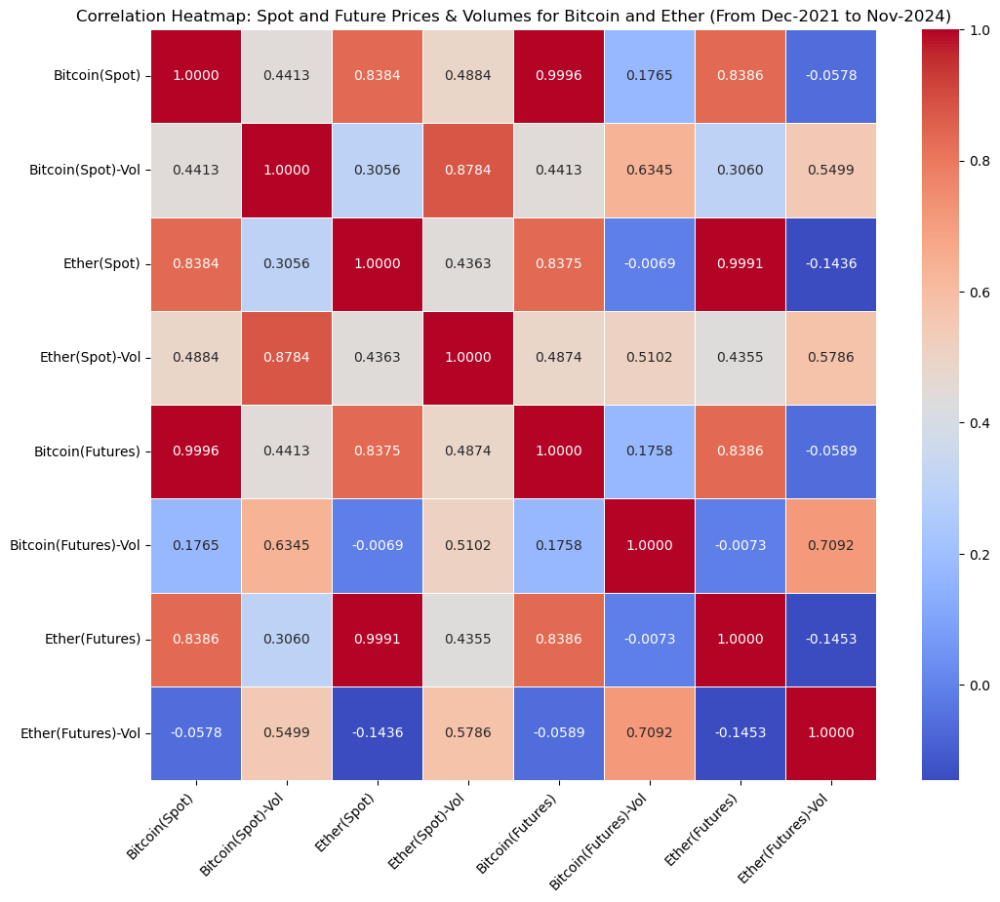

In [195]:
# Cryptocurrency (Spot & Futures)-Correlation Heatmap
# Date Range: Dec 2021 ~ Nov 2024 (3 yrs)
plt.figure(figsize=(12, 10))

heatmap = sns.heatmap(corr_crypto_3yrs_full, annot=True,fmt=".4f",cmap='coolwarm', linewidths=0.5)

tick_labels = ["Bitcoin(Spot)", "Bitcoin(Spot)-Vol", "Ether(Spot)", "Ether(Spot)-Vol", 
               "Bitcoin(Futures)", "Bitcoin(Futures)-Vol", "Ether(Futures)", "Ether(Futures)-Vol"]

heatmap.set_xticklabels(tick_labels, rotation=45,ha='right')
heatmap.set_yticklabels(tick_labels, rotation=0)

plt.title('Correlation Heatmap: Spot and Future Prices & Volumes for Bitcoin and Ether (From Dec-2021 to Nov-2024)')

plt.savefig('outputs/heatmap_crypto_spotFutures_3yrs.png', dpi=300)

plt.show()

In [196]:
def compare_correlation(short_df, long_df):

    if short_df.shape != long_df.shape:
        raise ValueError("The correlation dataframes must have the same shape")
    
    correlation_diff = short_df - long_df

    comparison_matrix = correlation_diff.applymap(
        lambda x: 'High' if x > 0 else 'Low' if x < 0 else 'Same'
    )

    for i in comparison_matrix.index:
        comparison_matrix.loc[i, i] = 'Same'
    
    return comparison_matrix

In [197]:
def correlation_change(short_df, long_df):

    if short_df.shape != long_df.shape:
        raise ValueError("The correlation dataframes must have the same shape")
    

    percentage_change = ((short_df - long_df) / long_df.abs()) * 100

    
    for i in percentage_change.index:
        percentage_change.loc[i, i] = 0.0
    
    return percentage_change

In [198]:
def plot_dual_y_axis(df, years, x_column, primary_y_columns, secondary_y_columns, 
                     primary_y_label, secondary_y_label, title, legend_labels=None):


    filtered_df = df[df['Year'].isin(years)]


    fig = go.Figure()
    

    if legend_labels is None:
        legend_labels = primary_y_columns + secondary_y_columns
    elif len(legend_labels) != len(primary_y_columns) + len(secondary_y_columns):
        raise ValueError("The number of legend_labels must match the total number of columns.")
    

    for column, label in zip(primary_y_columns, legend_labels[:len(primary_y_columns)]):
        fig.add_trace(go.Scatter(
            x=filtered_df[x_column],
            y=filtered_df[column],
            mode='lines',
            name=label,
            yaxis='y1'
        ))
    

    for column, label in zip(secondary_y_columns, legend_labels[len(primary_y_columns):]):
        fig.add_trace(go.Scatter(
            x=filtered_df[x_column],
            y=filtered_df[column],
            mode='lines',
            name=label,
            yaxis='y2'
        ))
    

    fig.update_layout(
        title=f"{title}",
        xaxis=dict(title=x_column),
        yaxis=dict(
            title=primary_y_label,
            showgrid=True,
            zeroline=False,
        ),
        yaxis2=dict(
            title=secondary_y_label,
            overlaying='y',
            side='right',
            showgrid=False,
        ),
        legend=dict(x=1.1, y=1),
        template='plotly_white'
    )
    

    fig.show()
    
    return fig

In [199]:
# Calculate the correlation difference
# dataframe 1 = corr_crypto_3yr_full: Dec 2021 ~ Nov 2024
# dataframe 2 = corr_crypto_full_na: Feb 2021 ~ Nov 2024
comparison_matrix_crypto3Yrs = compare_correlation(corr_crypto_3yrs_full, corr_crypto_full_na)
comparison_matrix_crypto3Yrs

,close_b,close_b_f,close_eth,close_eth_f,volume_b,volume_b_f,volume_eth,volume_eth_f
close_b,Same,High,High,High,High,High,High,High
close_b_f,High,Same,High,High,High,High,High,High
close_eth,High,High,Same,High,High,High,High,Low
close_eth_f,High,High,High,Same,High,High,High,Low
volume_b,High,High,High,High,Same,High,High,High
volume_b_f,High,High,High,High,High,Same,High,High
volume_eth,High,High,High,High,High,High,Same,High
volume_eth_f,High,High,Low,Low,High,High,High,Same


In [200]:
comparison_matrix_crypto3Yrs.to_csv("outputs/matrix_crypto_3yrVSfullna.csv", index=True)

In [201]:
# Percentage Change in Correlation (Dec 2021 - Nov 2024 vs. Feb 2021 - Nov 2024)
percent_change_fullCrypto_3yr = correlation_change(corr_crypto_3yrs_full, corr_crypto_full_na)
percent_change_fullCrypto_3yr

,close_b,close_b_f,close_eth,close_eth_f,volume_b,volume_b_f,volume_eth,volume_eth_f
close_b,0.000000,0.020377,8.714611,8.768321,13.604875,46.844199,16.672700,46.033849
close_b_f,0.020377,0.000000,8.634287,8.630346,13.318557,45.997681,16.273454,44.642583
close_eth,8.714611,8.634287,0.000000,0.020558,64.013436,90.184660,22.031857,-149.815127
close_eth_f,8.768321,8.630346,0.020558,0.000000,61.099513,89.473045,20.864337,-153.340248
volume_b,13.604875,13.318557,64.013436,61.099513,0.000000,44.380981,13.785846,155.934439
volume_b_f,46.844199,45.997681,90.184660,89.473045,44.380981,0.000000,59.238725,6.783407
volume_eth,16.672700,16.273454,22.031857,20.864337,13.785846,59.238725,0.000000,115.844250
volume_eth_f,46.033849,44.642583,-149.815127,-153.340248,155.934439,6.783407,115.844250,0.000000


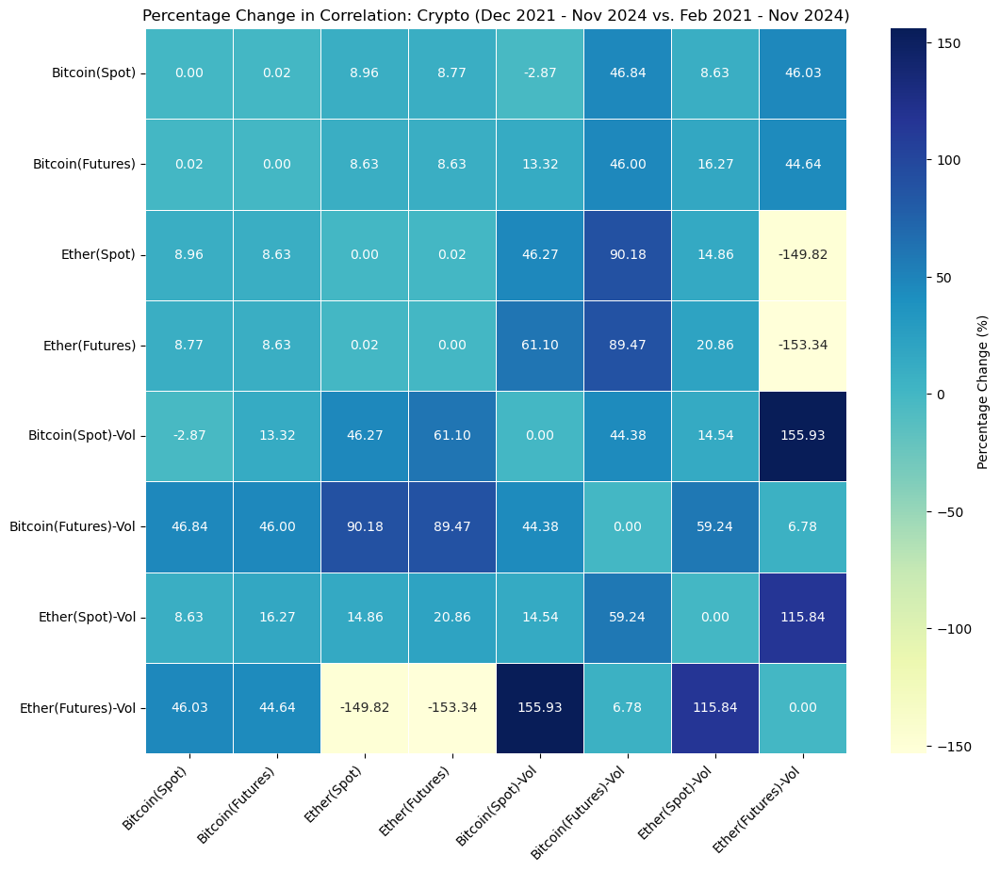

In [86]:
# Percentage Change in Correlation (Dec 2021 - Nov 2024 vs. Feb 2021 - Nov 2024)
plt.figure(figsize=(12, 10))

heatmap = sns.heatmap(percent_change_fullCrypto_3yr, annot=True,fmt=".2f",cmap='YlGnBu', linewidths=0.5,
                     cbar_kws={'label': 'Percentage Change (%)'})

tick_labels = ["Bitcoin(Spot)","Bitcoin(Futures)","Ether(Spot)","Ether(Futures)",
               "Bitcoin(Spot)-Vol","Bitcoin(Futures)-Vol","Ether(Spot)-Vol","Ether(Futures)-Vol"]

heatmap.set_xticklabels(tick_labels, rotation=45,ha='right')
heatmap.set_yticklabels(tick_labels, rotation=0)

plt.title('Percentage Change in Correlation: Crypto (Dec 2021 - Nov 2024 vs. Feb 2021 - Nov 2024)')

plt.savefig('outputs/heatmap_changeinCorr_crypto_3yrs.png', dpi=300)

plt.show()

#### Period 2: Two-year analysis  (Dec 2022 to Nov 2024)

In [202]:
# Cryptocurrency (Spot & Futures)-Correlation Table
# Date Range: Nov 2022 ~ Nov 2024 (2 yrs)
corr_crypto_2yrs_full = crypto_3yrs_full[(crypto_3yrs_full['date'] >= '2022-12-01')&
                        (crypto_3yrs_full['date'] <= '2024-11-29')].drop(columns=['date']).corr()
corr_crypto_2yrs_full

,close_b,volume_b,close_eth,volume_eth,close_b_f,volume_b_f,close_eth_f,volume_eth_f
close_b,1.000000,0.682483,0.913608,0.760880,0.999659,0.320867,0.913849,0.192288
volume_b,0.682483,1.000000,0.568851,0.925554,0.682491,0.656264,0.568455,0.557064
close_eth,0.913608,0.568851,1.000000,0.676758,0.912367,0.270443,0.999104,0.151563
volume_eth,0.760880,0.925554,0.676758,1.000000,0.759816,0.599640,0.674837,0.588307
close_b_f,0.999659,0.682491,0.912367,0.759816,1.000000,0.319850,0.913482,0.191440
volume_b_f,0.320867,0.656264,0.270443,0.599640,0.319850,1.000000,0.267697,0.716948
close_eth_f,0.913849,0.568455,0.999104,0.674837,0.913482,0.267697,1.000000,0.147943
volume_eth_f,0.192288,0.557064,0.151563,0.588307,0.191440,0.716948,0.147943,1.000000


In [203]:
# Correlation significance test
correlations_crpto_2yrs = {'Ether(Futures) v.s. Ether(Futures)-Volume':0.147943,
                           'Bitcoin(Spot) v.s. Ether(Futures)-Volume':0.192288,
                           'Ether(Spot) v.s. Ether(Futures)-Volume':0.151563,
                          }

n = len(crypto_3yrs_full[(crypto_3yrs_full['date'] >= '2022-12-01')&
                        (crypto_3yrs_full['date'] <= '2024-11-29')])

corr_statsig(correlations_crpto_2yrs, n)

Ether(Futures) v.s. Ether(Futures)-Volume:
  Correlation (r): 0.1479
  t-statistic: 3.3483
  p-value: 0.0009
  Significant: Yes
--------------------------------------------------
Bitcoin(Spot) v.s. Ether(Futures)-Volume:
  Correlation (r): 0.1923
  t-statistic: 4.3858
  p-value: 0.0000
  Significant: Yes
--------------------------------------------------
Ether(Spot) v.s. Ether(Futures)-Volume:
  Correlation (r): 0.1516
  t-statistic: 3.4321
  p-value: 0.0006
  Significant: Yes
--------------------------------------------------


In [204]:
corr_crypto_2yrs_full.to_csv("outputs/corr_fullCrypto_2yr.csv", index=True)

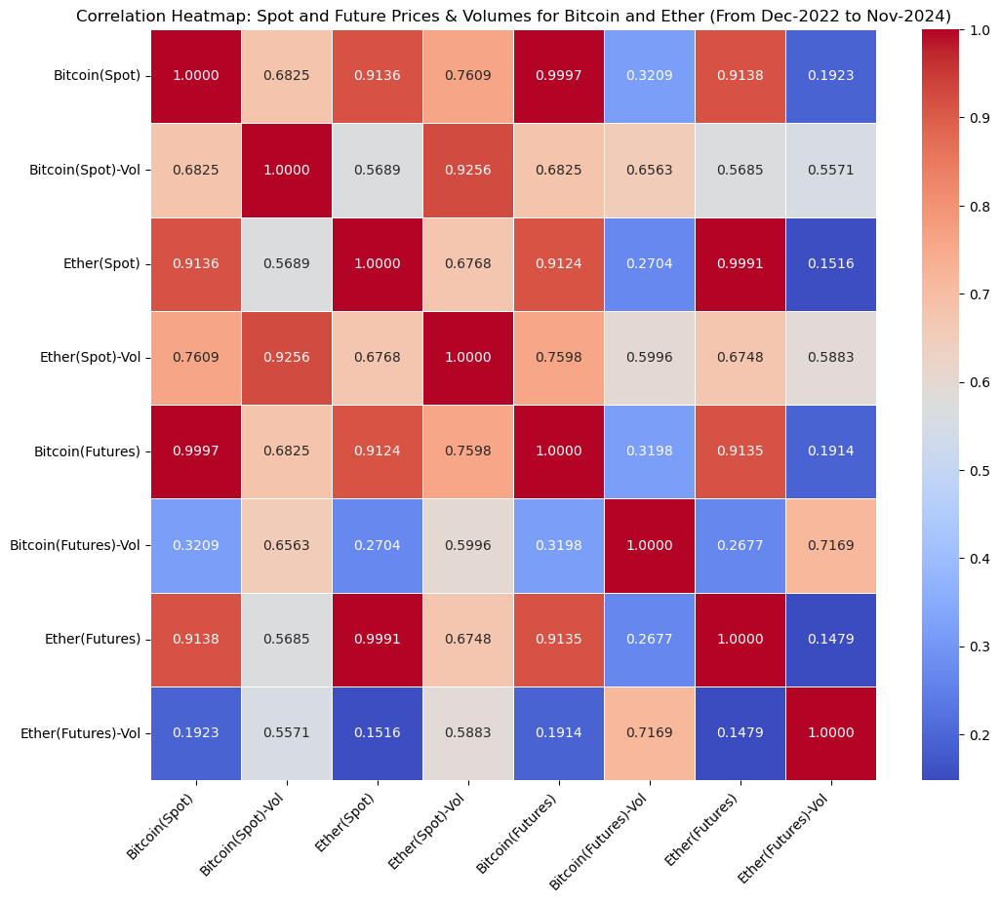

In [205]:
# Cryptocurrency (Spot & Futures) - Correlation Heatmap
# Date Range: Dec 2022 ~ Nov 2024 (2 yrs)

plt.figure(figsize=(12, 10))

heatmap = sns.heatmap(corr_crypto_2yrs_full, annot=True,fmt=".4f",cmap='coolwarm', linewidths=0.5)

tick_labels = ["Bitcoin(Spot)", "Bitcoin(Spot)-Vol", "Ether(Spot)", "Ether(Spot)-Vol", 
               "Bitcoin(Futures)", "Bitcoin(Futures)-Vol", "Ether(Futures)", "Ether(Futures)-Vol"]

heatmap.set_xticklabels(tick_labels, rotation=45,ha='right')
heatmap.set_yticklabels(tick_labels, rotation=0)

plt.title('Correlation Heatmap: Spot and Future Prices & Volumes for Bitcoin and Ether (From Dec-2022 to Nov-2024)')

plt.savefig('outputs/heatmap_crypto_spotFutures_2yrs.png', dpi=300)

plt.show()

In [206]:
# Calculate the correlation difference
# dataframe 1 = corr_crypto_3yr_full: Dec 2021 ~ Nov 2024
# dataframe 2 = corr_crypto_2yrs_full: Dec 2022 ~ Nov 2024
comparison_matrix_crypto2Yrs = compare_correlation(corr_crypto_2yrs_full, corr_crypto_3yrs_full)
comparison_matrix_crypto2Yrs

,close_b,volume_b,close_eth,volume_eth,close_b_f,volume_b_f,close_eth_f,volume_eth_f
close_b,Same,High,High,High,High,High,High,High
volume_b,High,Same,High,High,High,High,High,High
close_eth,High,High,Same,High,High,High,High,High
volume_eth,High,High,High,Same,High,High,High,High
close_b_f,High,High,High,High,Same,High,High,High
volume_b_f,High,High,High,High,High,Same,High,High
close_eth_f,High,High,High,High,High,High,Same,High
volume_eth_f,High,High,High,High,High,High,High,Same


In [207]:
# Percentage Change in Correlation (Dec 2022 - Nov 2024 vs. Dec 2021 - Nov 2024)/ 2 yrs v.s. 3 yrs
percent_change_fullCrypto_2yr = correlation_change(corr_crypto_2yrs_full, corr_crypto_3yrs_full)
percent_change_fullCrypto_2yr

,close_b,volume_b,close_eth,volume_eth,close_b_f,volume_b_f,close_eth_f,volume_eth_f
close_b,0.000000,54.641493,8.972411,55.789776,0.001199,81.788482,8.971793,432.818596
volume_b,54.641493,0.000000,86.159029,5.370070,54.666653,3.426926,85.746545,1.307712
close_eth,8.972411,86.159029,0.000000,55.101372,8.941681,4036.263747,0.002376,205.581087
volume_eth,55.789776,5.370070,55.101372,0.000000,55.892561,17.538304,54.971486,1.684580
close_b_f,0.001199,54.666653,8.941681,55.892561,0.000000,81.988700,8.925634,424.887419
volume_b_f,81.788482,3.426926,4036.263747,17.538304,81.988700,0.000000,3785.182366,1.085493
close_eth_f,8.971793,85.746545,0.002376,54.971486,8.925634,3785.182366,0.000000,201.796017
volume_eth_f,432.818596,1.307712,205.581087,1.684580,424.887419,1.085493,201.796017,0.000000


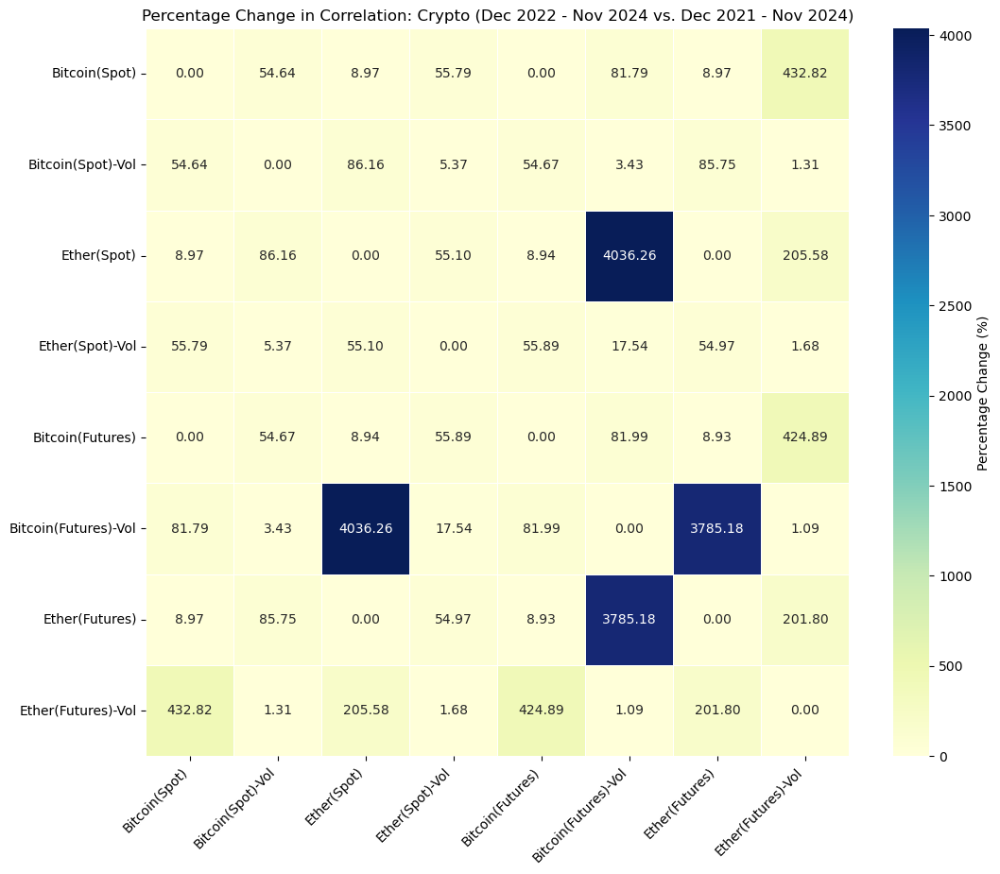

In [208]:
# Percentage Change in Correlation (Dec 2023 - Nov 2024 vs. Dec 2022 - Nov 2024)
plt.figure(figsize=(12, 10))

heatmap = sns.heatmap(percent_change_fullCrypto_2yr, annot=True,fmt=".2f",cmap='YlGnBu', linewidths=0.5,
                     cbar_kws={'label': 'Percentage Change (%)'})

tick_labels = ["Bitcoin(Spot)", "Bitcoin(Spot)-Vol", "Ether(Spot)", "Ether(Spot)-Vol", 
               "Bitcoin(Futures)", "Bitcoin(Futures)-Vol", "Ether(Futures)", "Ether(Futures)-Vol"]

heatmap.set_xticklabels(tick_labels, rotation=45,ha='right')
heatmap.set_yticklabels(tick_labels, rotation=0)

plt.title('Percentage Change in Correlation: Crypto (Dec 2022 - Nov 2024 vs. Dec 2021 - Nov 2024)')

plt.savefig('outputs/heatmap_changeinCorr_crypto_2yrs.png', dpi=300)

plt.show()

#### Period 3: One-year analysis (Nov 2023 to Nov 2024)

In [209]:
# Cryptocurrency (Spot & Futures)-Correlation Table
# Date Range: Dec 2023 ~ Nov 2024 (1 yr)
corr_crypto_1yr_full = crypto_3yrs_full[(crypto_3yrs_full['date'] >= '2023-12-01')&
                                  (crypto_3yrs_full['date'] <= '2024-11-29')].drop(columns=['date']).corr()
corr_crypto_1yr_full


,close_b,volume_b,close_eth,volume_eth,close_b_f,volume_b_f,close_eth_f,volume_eth_f
close_b,1.000000,0.590994,0.637552,0.584964,0.998458,0.210848,0.638785,0.189348
volume_b,0.590994,1.000000,0.272015,0.914633,0.590284,0.728498,0.271692,0.602694
close_eth,0.637552,0.272015,1.000000,0.339827,0.632592,0.070239,0.997058,0.060281
volume_eth,0.584964,0.914633,0.339827,1.000000,0.581079,0.669624,0.335361,0.706566
close_b_f,0.998458,0.590284,0.632592,0.581079,1.000000,0.206100,0.637185,0.184952
volume_b_f,0.210848,0.728498,0.070239,0.669624,0.206100,1.000000,0.063464,0.686584
close_eth_f,0.638785,0.271692,0.997058,0.335361,0.637185,0.063464,1.000000,0.050329
volume_eth_f,0.189348,0.602694,0.060281,0.706566,0.184952,0.686584,0.050329,1.000000


In [210]:
corr_crypto_1yr_full.to_csv("outputs/corr_fullCrypto_1yr.csv", index=True)

In [211]:
# Correlation significance test
correlations_crpto_1yrs = {'Ether(Futures) v.s. Ether(Futures)-Volume':0.050329,
                           'Bitcoin(Spot) v.s. Ether(Futures)-Volume':0.189348,
                           'Ether(Spot) v.s. Ether(Futures)-Volume':0.060281,
                           'Ether(Spot)  v.s. Bitcoin(Futures)-Volume': 0.070239,
                          }

n = len(crypto_3yrs_full[(crypto_3yrs_full['date'] >= '2023-12-01')&
                        (crypto_3yrs_full['date'] <= '2024-11-29')])

corr_statsig(correlations_crpto_1yrs, n)

Ether(Futures) v.s. Ether(Futures)-Volume:
  Correlation (r): 0.0503
  t-statistic: 0.7952
  p-value: 0.4273
  Significant: No
--------------------------------------------------
Bitcoin(Spot) v.s. Ether(Futures)-Volume:
  Correlation (r): 0.1893
  t-statistic: 3.0429
  p-value: 0.0026
  Significant: Yes
--------------------------------------------------
Ether(Spot) v.s. Ether(Futures)-Volume:
  Correlation (r): 0.0603
  t-statistic: 0.9530
  p-value: 0.3415
  Significant: No
--------------------------------------------------
Ether(Spot)  v.s. Bitcoin(Futures)-Volume:
  Correlation (r): 0.0702
  t-statistic: 1.1111
  p-value: 0.2676
  Significant: No
--------------------------------------------------


In [212]:
print(len(crypto_3yrs_full[(crypto_3yrs_full['date'] >= '2023-12-01')&
                                  (crypto_3yrs_full['date'] <= '2024-11-29')]))

251


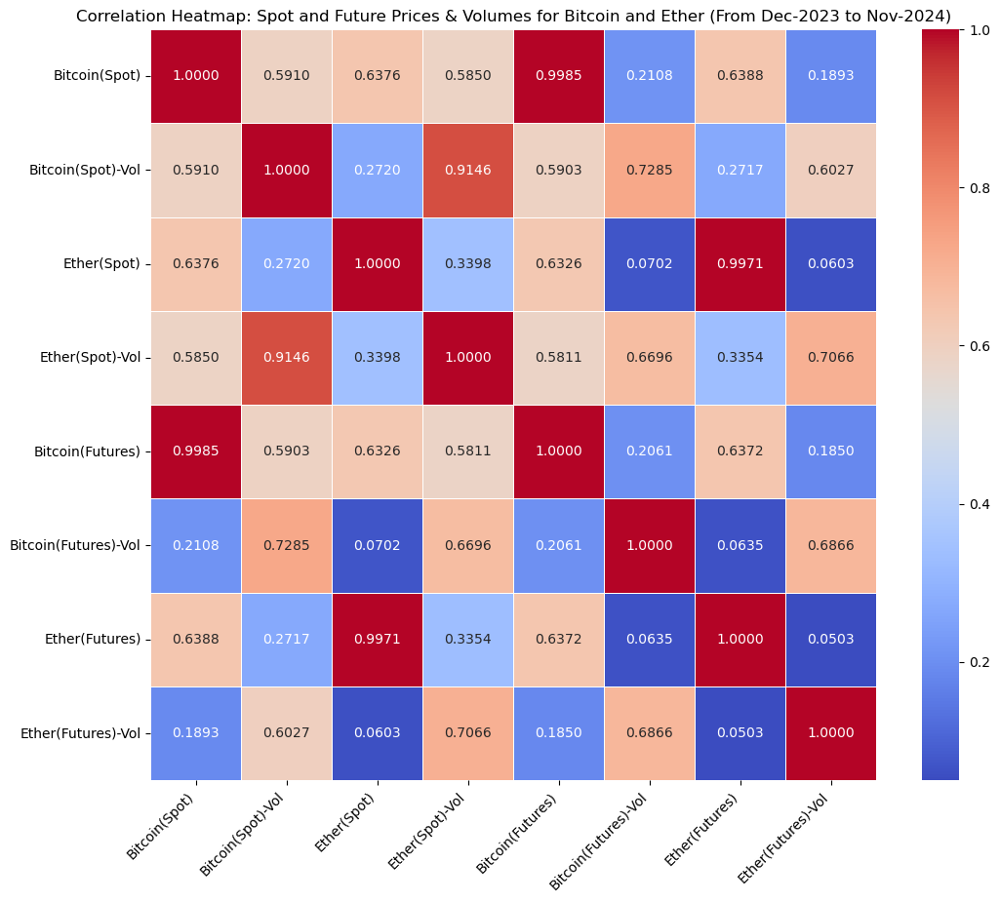

In [213]:
# Cryptocurrency (Spot & Futures)-Correlation Heatmap
# Date Range: Dec 2023 ~ Nov 2024 (1 yrs)
plt.figure(figsize=(12, 10))

heatmap = sns.heatmap(corr_crypto_1yr_full, annot=True,fmt=".4f",cmap='coolwarm', linewidths=0.5)

tick_labels = ["Bitcoin(Spot)", "Bitcoin(Spot)-Vol", "Ether(Spot)", "Ether(Spot)-Vol", 
               "Bitcoin(Futures)", "Bitcoin(Futures)-Vol", "Ether(Futures)", "Ether(Futures)-Vol"]

heatmap.set_xticklabels(tick_labels, rotation=45,ha='right')
heatmap.set_yticklabels(tick_labels, rotation=0)

plt.title('Correlation Heatmap: Spot and Future Prices & Volumes for Bitcoin and Ether (From Dec-2023 to Nov-2024)')

plt.savefig('outputs/heatmap_crypto_spotFutures_1yr.png', dpi=300)

plt.show()

In [214]:
# Calculate the correlation difference
# dataframe 1 = corr_crypto_1yr_full: Dec 2023 ~ Nov 2024
# dataframe 2 = corr_crypto_2yrs_full: Dec 2022 ~ Nov 2024
comparison_matrix_crypto1Yr = compare_correlation(corr_crypto_1yr_full, corr_crypto_2yrs_full)
comparison_matrix_crypto1Yr


,close_b,volume_b,close_eth,volume_eth,close_b_f,volume_b_f,close_eth_f,volume_eth_f
close_b,Same,Low,Low,Low,Low,Low,Low,Low
volume_b,Low,Same,Low,Low,Low,High,Low,High
close_eth,Low,Low,Same,Low,Low,Low,Low,Low
volume_eth,Low,Low,Low,Same,Low,High,Low,High
close_b_f,Low,Low,Low,Low,Same,Low,Low,Low
volume_b_f,Low,High,Low,High,Low,Same,Low,Low
close_eth_f,Low,Low,Low,Low,Low,Low,Same,Low
volume_eth_f,Low,High,Low,High,Low,Low,Low,Same


In [215]:
# Percentage Change in Correlation (Dec 2023 - Nov 2024 vs. Dec 2022 - Nov 2024)/ 1 yrs v.s. 2 yrs
percent_change_fullCrypto_1yr = correlation_change(corr_crypto_1yr_full, corr_crypto_2yrs_full)
percent_change_fullCrypto_1yr

,close_b,volume_b,close_eth,volume_eth,close_b_f,volume_b_f,close_eth_f,volume_eth_f
close_b,0.000000,-13.405254,-30.216056,-23.120059,-0.120125,-34.288137,-30.099501,-1.528847
volume_b,-13.405254,0.000000,-52.181649,-1.179851,-13.510365,11.006871,-52.205240,8.191102
close_eth,-30.216056,-52.181649,0.000000,-49.786135,-30.664768,-74.028133,-0.204825,-60.227190
volume_eth,-23.120059,-1.179851,-49.786135,0.000000,-23.523655,11.671057,-50.304839,20.101590
close_b_f,-0.120125,-13.510365,-30.664768,-23.523655,0.000000,-35.563598,-30.246590,-3.389029
volume_b_f,-34.288137,11.006871,-74.028133,11.671057,-35.563598,0.000000,-76.292612,-4.235244
close_eth_f,-30.099501,-52.205240,-0.204825,-50.304839,-30.246590,-76.292612,0.000000,-65.980483
volume_eth_f,-1.528847,8.191102,-60.227190,20.101590,-3.389029,-4.235244,-65.980483,0.000000


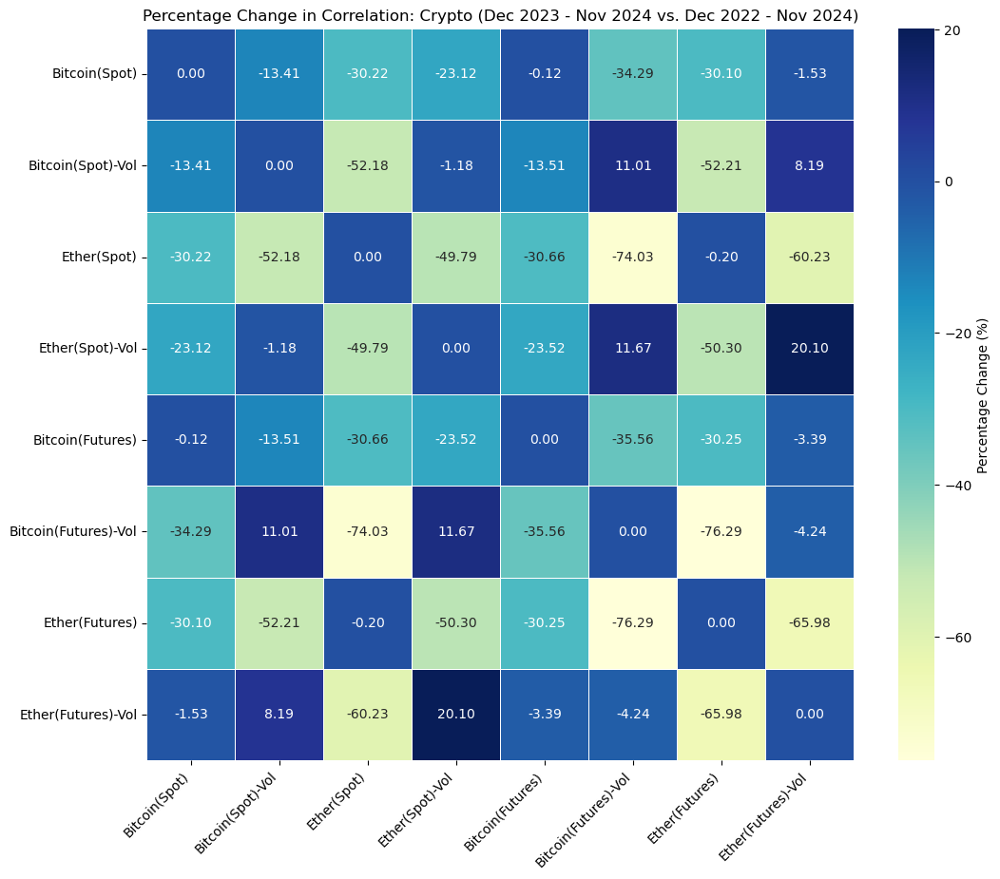

In [216]:
# Percentage Change in Correlation (Dec 2023 - Nov 2024 vs. Dec 2022 - Nov 2024)
plt.figure(figsize=(12, 10))

heatmap = sns.heatmap(percent_change_fullCrypto_1yr, annot=True,fmt=".2f",cmap='YlGnBu', linewidths=0.5,
                     cbar_kws={'label': 'Percentage Change (%)'})

tick_labels = ["Bitcoin(Spot)", "Bitcoin(Spot)-Vol", "Ether(Spot)", "Ether(Spot)-Vol", 
               "Bitcoin(Futures)", "Bitcoin(Futures)-Vol", "Ether(Futures)", "Ether(Futures)-Vol"]

heatmap.set_xticklabels(tick_labels, rotation=45,ha='right')
heatmap.set_yticklabels(tick_labels, rotation=0)

plt.title('Percentage Change in Correlation: Crypto (Dec 2023 - Nov 2024 vs. Dec 2022 - Nov 2024)')

plt.savefig('outputs/heatmap_changeinCorr_crypto_1yrs.png', dpi=300)

plt.show()

In [217]:
crypto_1yr_df = crypto_3yrs_full[(crypto_3yrs_full['date'] >= '2023-12-01')&
                                  (crypto_3yrs_full['date'] <= '2024-11-29')]
crypto_1yr_df.head()

,date,close_b,volume_b,close_eth,volume_eth,close_b_f,volume_b_f,close_eth_f,volume_eth_f
504,2023-12-01,38688.750000,23512784002,2087.139893,10866891430,39225.0,11744,2118.0,6314
505,2023-12-04,41980.097656,39856129827,2243.215820,16149367134,42280.0,13276,2255.0,6640
506,2023-12-05,44080.648438,36312154535,2293.841797,15383072559,44290.0,10616,2292.0,7144
507,2023-12-06,43746.445312,29909761586,2231.661377,12790612571,44215.0,9164,2275.5,3797
508,2023-12-07,43292.664062,27635760671,2357.579590,14766891042,43700.0,7768,2371.0,7266


In [218]:
crypto_1yr_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 251 entries, 504 to 754
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          251 non-null    datetime64[ns]
 1   close_b       251 non-null    float64       
 2   volume_b      251 non-null    int64         
 3   close_eth     251 non-null    float64       
 4   volume_eth    251 non-null    int64         
 5   close_b_f     251 non-null    float64       
 6   volume_b_f    251 non-null    int64         
 7   close_eth_f   251 non-null    float64       
 8   volume_eth_f  251 non-null    int64         
dtypes: datetime64[ns](1), float64(4), int64(4)
memory usage: 19.6 KB


In [219]:
crypto_1yr_df_copy = crypto_1yr_df.copy()
crypto_1yr_df_copy['Year'] = crypto_1yr_df_copy['date'].dt.year
crypto_1yr_df_copy['Month'] = crypto_1yr_df_copy['date'].dt.month
crypto_1yr_df_copy.head()

,date,close_b,volume_b,close_eth,volume_eth,close_b_f,volume_b_f,close_eth_f,volume_eth_f,Year,Month
504,2023-12-01,38688.750000,23512784002,2087.139893,10866891430,39225.0,11744,2118.0,6314,2023,12
505,2023-12-04,41980.097656,39856129827,2243.215820,16149367134,42280.0,13276,2255.0,6640,2023,12
506,2023-12-05,44080.648438,36312154535,2293.841797,15383072559,44290.0,10616,2292.0,7144,2023,12
507,2023-12-06,43746.445312,29909761586,2231.661377,12790612571,44215.0,9164,2275.5,3797,2023,12
508,2023-12-07,43292.664062,27635760671,2357.579590,14766891042,43700.0,7768,2371.0,7266,2023,12


In [220]:
# Bitcoin Price and Trading Volume (Jan 2024 - Nov 2024)
fig_vol = plot_dual_y_axis(
    df=crypto_1yr_df_copy,
    years=[2024],
    x_column='date',
    primary_y_columns=['close_b'],
    secondary_y_columns=['volume_b'],
    primary_y_label='Bitcoin Price (USD)',
    secondary_y_label='Bitcoin Trading Volume',
    title='Bitcoin Price and Trading Volume (Jan 2024 - Nov 2024)',
    legend_labels=['Price (Spot)', 'Volume']
)

fig_vol.data[1].opacity = 0.5

fig_vol.show()

## 4.2 Cyrptocurrencies v.s. Copper/Aluminum
---
- **Heatmap Visualizations & Hypothesis Testing**
    - **4.2.1 Five-Year Period**: Dec 2019 – Nov 2024  
    - **4.2.2 COVID-19 Period**: Mar 2020 – May 2023  
    - **4.2.3 Post-COVID Period**: Jun 2023 – Nov 2024  

In [221]:
copper_daily = pd.read_csv("resources/copper_daily_f.csv")
alu_daily = pd.read_csv("resources/alu_daily_f.csv")
gold_daily = pd.read_csv("resources/gold_daily_f.csv")

In [222]:
copper_daily.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2014-12-01,2.8575,2.9405,2.7990,2.9305,2.9305,1035
1,2014-12-02,2.9225,2.9225,2.8775,2.9135,2.9135,246
2,2014-12-03,2.9100,2.9105,2.8870,2.8930,2.8930,440
3,2014-12-04,2.8880,2.9410,2.8880,2.9325,2.9325,564
4,2014-12-05,2.9255,2.9450,2.9215,2.9255,2.9255,408


In [223]:
copper_daily_df = copper_daily[['Date', 'Close', 'Volume']].rename(columns={'Close': 'close_cop', 'Volume': 'volume_cop'})
alu_daily_df = alu_daily[['Date', 'Close', 'Volume']].rename(columns={'Close': 'close_alu', 'Volume': 'volume_alu'})
gold_daily_df = gold_daily[['Date', 'Close', 'Volume']].rename(columns={'Close': 'close_gold', 'Volume': 'volume_gold'})


In [224]:
copper_daily_df = copper_daily[['Date', 'Close', 'Volume']].assign(
        Close=lambda x: x['Close'] * 2204.62).rename(columns={'Close': 'close_cop', 'Volume': 'volume_cop'})
alu_daily_df = alu_daily[['Date', 'Close', 'Volume']].rename(columns={'Close': 'close_alu', 'Volume': 'volume_alu'})
gold_daily_df = gold_daily[['Date', 'Close', 'Volume']].rename(columns={'Close': 'close_gold', 'Volume': 'volume_gold'})


In [225]:
for df in [copper_daily_df, alu_daily_df,gold_daily_df]:
    df['Date'] = pd.to_datetime(df['Date'])

In [226]:
merged_df = pd.merge(copper_daily_df,alu_daily_df, on='Date', how='left')
comm_daily_df = pd.merge(merged_df,gold_daily_df, on='Date', how='left').rename(columns = {"Date":"date"})
comm_daily_df.tail()

,date,close_cop,volume_cop,close_alu,volume_alu,close_gold,volume_gold
2510,2024-11-22,8981.621619,514,2556.00,0.0,2709.899902,41.0
2511,2024-11-25,9020.202301,335,2580.75,0.0,2616.800049,94.0
2512,2024-11-26,8904.460256,37274,2555.25,14.0,2620.300049,177858.0
2513,2024-11-27,8966.189347,11425,2556.50,0.0,2639.899902,61653.0
2514,2024-11-29,8995.952188,1274,2562.00,12.0,2657.000000,3861.0


In [227]:
comm_daily_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2515 entries, 0 to 2514
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         2515 non-null   datetime64[ns]
 1   close_cop    2515 non-null   float64       
 2   volume_cop   2515 non-null   int64         
 3   close_alu    2479 non-null   float64       
 4   volume_alu   2479 non-null   float64       
 5   close_gold   2514 non-null   float64       
 6   volume_gold  2514 non-null   float64       
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 157.2 KB


In [228]:
# Missing data (Time frame)
# Gold:11-23-2023
# Aluminum: 09-06-2016 ~ 09-28-2016 ; 10-06-2016 ~ 10-27-2016 ; 07-06-2017 ~ 07-10-2017 ; 11-23-2023
comm_daily_df[comm_daily_df['close_alu'].isna()]

,date,close_cop,volume_cop,close_alu,volume_alu,close_gold,volume_gold
444,2016-09-06,4594.428324,800,NaN,NaN,1349.400024,46.0
445,2016-09-07,4614.269517,478,NaN,NaN,1344.300049,14.0
446,2016-09-08,4620.883423,429,NaN,NaN,1336.800049,30.0
447,2016-09-09,4604.348920,662,NaN,NaN,1330.099976,35.0
448,2016-09-12,4620.883423,357,NaN,NaN,1321.000000,177.0
449,2016-09-13,4619.781193,474,NaN,NaN,1319.000000,79.0
450,2016-09-14,4735.523764,815,NaN,NaN,1321.500000,73.0
451,2016-09-15,4744.342131,1067,NaN,NaN,1313.500000,37.0
452,2016-09-16,4743.239901,418,NaN,NaN,1305.800049,4.0
453,2016-09-19,4737.728224,550,NaN,NaN,1313.500000,20.0


In [229]:
comm_daily_df = comm_daily_df.dropna(subset=['close_alu']).reset_index(drop=True)
comm_daily_df.tail()

,date,close_cop,volume_cop,close_alu,volume_alu,close_gold,volume_gold
2474,2024-11-22,8981.621619,514,2556.00,0.0,2709.899902,41.0
2475,2024-11-25,9020.202301,335,2580.75,0.0,2616.800049,94.0
2476,2024-11-26,8904.460256,37274,2555.25,14.0,2620.300049,177858.0
2477,2024-11-27,8966.189347,11425,2556.50,0.0,2639.899902,61653.0
2478,2024-11-29,8995.952188,1274,2562.00,12.0,2657.000000,3861.0


In [230]:
comm_daily_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2479 entries, 0 to 2478
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         2479 non-null   datetime64[ns]
 1   close_cop    2479 non-null   float64       
 2   volume_cop   2479 non-null   int64         
 3   close_alu    2479 non-null   float64       
 4   volume_alu   2479 non-null   float64       
 5   close_gold   2479 non-null   float64       
 6   volume_gold  2479 non-null   float64       
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 135.7 KB


In [231]:
comm_daily_df.to_csv("outputs/comm_daily_cleaned_122014_112024.csv", index=True)

### 4.2.1 Five-Year Period: Dec 2019 – Nov 2024  

In [232]:
comm_daily_df_5yr = comm_daily_df[(comm_daily_df['date'] >= '2019-12-01')&
                                  (comm_daily_df['date'] <= '2024-11-29')].reset_index(drop=True)

comm_crypto_df_5yr = pd.merge(comm_daily_df_5yr,crypto_spot_5yr_df, on='date', how='left')
comm_crypto_df_5yr.tail()

,date,close_cop,volume_cop,close_alu,volume_alu,close_gold,volume_gold,close_b,volume_b,close_eth,volume_eth
1253,2024-11-22,8981.621619,514,2556.00,0.0,2709.899902,41.0,98997.664062,78473580551,3331.600830,36775716442
1254,2024-11-25,9020.202301,335,2580.75,0.0,2616.800049,94.0,93102.296875,80909462490,3413.543945,51544793988
1255,2024-11-26,8904.460256,37274,2555.25,14.0,2620.300049,177858.0,91985.320312,91656519855,3326.517334,39902959158
1256,2024-11-27,8966.189347,11425,2556.50,0.0,2639.899902,61653.0,95962.531250,71133452438,3657.249268,43383987191
1257,2024-11-29,8995.952188,1274,2562.00,12.0,2657.000000,3861.0,97461.523438,54968682476,3593.494385,27622629486


In [233]:
corr_comm_crypto_5yr = comm_crypto_df_5yr.drop(columns=['date']).corr()
corr_comm_crypto_5yr

,close_cop,volume_cop,close_alu,volume_alu,close_gold,volume_gold,close_b,volume_b,close_eth,volume_eth
close_cop,1.000000,0.015601,0.863313,0.043498,0.467304,-0.007019,0.760446,0.086609,0.856105,0.255817
volume_cop,0.015601,1.000000,0.006178,0.069966,0.001070,0.199996,0.020025,0.026058,0.005506,0.033361
close_alu,0.863313,0.006178,1.000000,-0.022535,0.231970,-0.003192,0.546178,-0.005615,0.746324,0.144047
volume_alu,0.043498,0.069966,-0.022535,1.000000,0.185803,0.067180,0.059156,-0.154459,0.046332,-0.173069
close_gold,0.467304,0.001070,0.231970,0.185803,1.000000,-0.002327,0.692472,0.044036,0.463479,0.057312
volume_gold,-0.007019,0.199996,-0.003192,0.067180,-0.002327,1.000000,0.012403,0.003336,0.003154,0.009504
close_b,0.760446,0.020025,0.546178,0.059156,0.692472,0.012403,1.000000,0.301565,0.869329,0.384970
volume_b,0.086609,0.026058,-0.005615,-0.154459,0.044036,0.003336,0.301565,1.000000,0.120308,0.786912
close_eth,0.856105,0.005506,0.746324,0.046332,0.463479,0.003154,0.869329,0.120308,1.000000,0.296513
volume_eth,0.255817,0.033361,0.144047,-0.173069,0.057312,0.009504,0.384970,0.786912,0.296513,1.000000


In [234]:
# Correlation significance test: five-year period
correlations_comm_crypto_5yr = {'Gold(Futures) v.s. Copper(Futures)': corr_comm_crypto_5yr.iloc[4,0],
                'Gold(Futures) v.s. Aluminum(Futures)': corr_comm_crypto_5yr.iloc[4,2],
               'Gold(Futures) v.s. Aluminum(Futures)-Vol': corr_comm_crypto_5yr.iloc[4,3],
               }

n = len(comm_crypto_df_5yr)

corr_statsig(correlations_comm_crypto_5yr, n)

Gold(Futures) v.s. Copper(Futures):
  Correlation (r): 0.4673
  t-statistic: 18.7325
  p-value: 0.0000
  Significant: Yes
--------------------------------------------------
Gold(Futures) v.s. Aluminum(Futures):
  Correlation (r): 0.2320
  t-statistic: 8.4516
  p-value: 0.0000
  Significant: Yes
--------------------------------------------------
Gold(Futures) v.s. Aluminum(Futures)-Vol:
  Correlation (r): 0.1858
  t-statistic: 6.7016
  p-value: 0.0000
  Significant: Yes
--------------------------------------------------


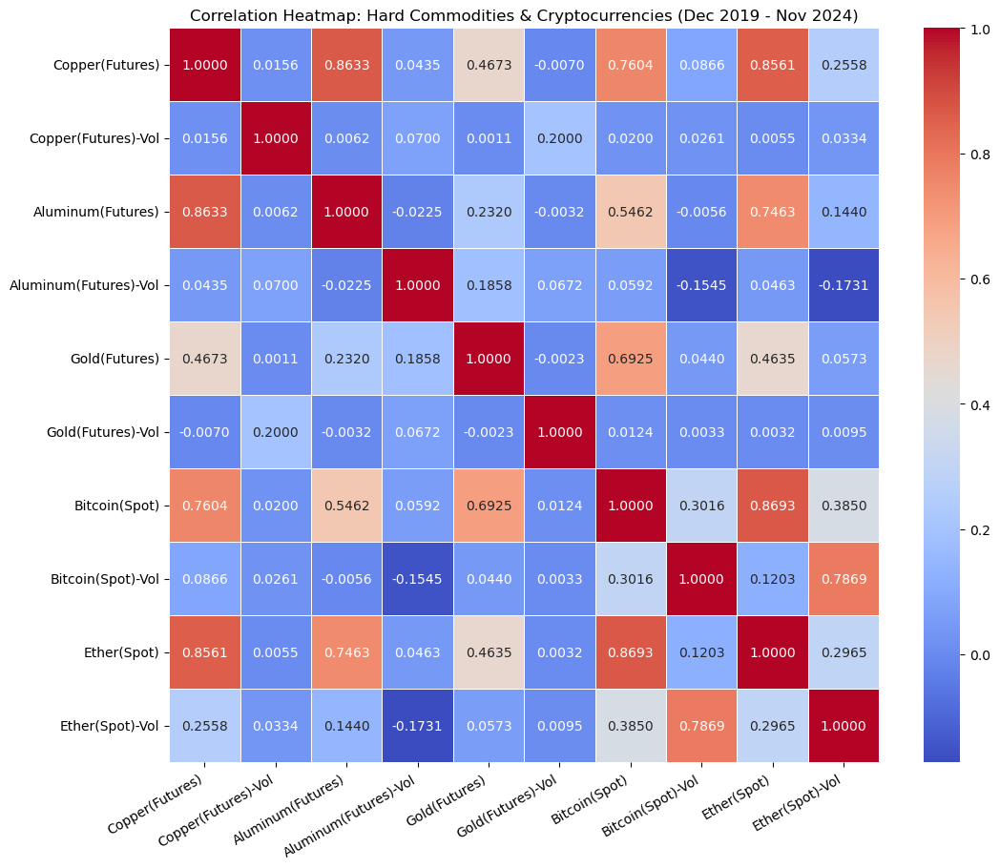

In [235]:
plt.figure(figsize=(12, 10))

heatmap = sns.heatmap(corr_comm_crypto_5yr, annot=True,fmt=".4f",cmap='coolwarm', linewidths=0.5)

tick_labels = ["Copper(Futures)", "Copper(Futures)-Vol", "Aluminum(Futures)", "Aluminum(Futures)-Vol",
               "Gold(Futures)", "Gold(Futures)-Vol",
                "Bitcoin(Spot)", "Bitcoin(Spot)-Vol", "Ether(Spot)", "Ether(Spot)-Vol"]

heatmap.set_xticklabels(tick_labels, rotation=30,ha='right')
heatmap.set_yticklabels(tick_labels, rotation=0)

plt.title('Correlation Heatmap: Hard Commodities & Cryptocurrencies (Dec 2019 - Nov 2024)')

plt.savefig('outputs/heatmap_crypto_comm_5yrs.png', dpi=300)

plt.show()


In [236]:
def plot_comm_vs_factor(comm_value, comm_label, factor_value, factor_label,factor_unit,time_frame, factor_df, comm_df):
  
    fig = go.Figure()

    
    fig.add_trace(go.Scatter(
        x=comm_df['date'], 
        y=comm_df[comm_value], 
        mode='lines', 
        name=comm_label
    ))
        
   
    fig.add_trace(go.Scatter(
        x=comm_df['date'], 
        y=factor_df[factor_value], 
        mode='lines', 
        name=factor_label, 
        yaxis='y2'
    ))

    
 
    date_num = comm_df['date'].map(pd.Timestamp.toordinal)

  
    slope_comm, intercept_comm, *_ = linregress(date_num, comm_df[comm_value])
    comm_trendline = slope_comm * date_num + intercept_comm
    fig.add_trace(go.Scatter(
        x=comm_df['date'], 
        y=comm_trendline, 
        mode='lines', 
        name=f'{comm_label} Trendline', 
        line=dict(dash='dash', color='blue')
    ))

  
    slope_factor, intercept_factor, *_ = linregress(date_num, factor_df[factor_value])
    factor_trendline = slope_factor * date_num + intercept_factor
    fig.add_trace(go.Scatter(
        x=comm_df['date'], 
        y=factor_trendline, 
        mode='lines', 
        name=f'{factor_label} Trendline', 
        line=dict(dash='dash', color='red'),
        yaxis='y2'
    ))

  
    fig.update_layout(
        title=f'{comm_label} with {factor_label} ({time_frame})',
        xaxis_title='Date',
        yaxis=dict(
            title=f'{comm_label}(USD/Metric Ton)',
            titlefont=dict(color='blue'),
            tickfont=dict(color='blue'),
            showgrid=True,
        ),
        yaxis2=dict(
            title=f'{factor_label}({factor_unit})',
            titlefont=dict(color='red'),
            tickfont=dict(color='red'),
            overlaying='y',
            side='right',
            showgrid=False
        ),
        legend=dict(x=1.1, y=1), 
        template='plotly_white',
    )

    fig.show()


    correlation, _ = pearsonr(factor_df[factor_value], comm_df[comm_value])


    print(f"Quick Summary")
    print(f"--------------")
    print(f"The Pearson correlation between {comm_label} and {factor_label} is: {round(correlation, 3)}")
    print(f"The slope of the {comm_label} trendline is: {round(slope_comm, 6)}")
    print(f"The slope of the {factor_label} trendline is: {round(slope_factor, 6)}")

In [237]:
plot_comm_vs_factor(
    comm_value='close_cop', 
    comm_label='Copper Futures Close Price',
    factor_value='close_b', 
    factor_label='Bitcoin Spot Price',
    factor_unit = 'USD',
    time_frame = 'From Dec-2019 to Nov-2024',
    factor_df=comm_crypto_df_5yr, 
    comm_df=comm_crypto_df_5yr
)

Quick Summary
--------------
The Pearson correlation between Copper Futures Close Price and Bitcoin Spot Price is: 0.76
The slope of the Copper Futures Close Price trendline is: 1.516676
The slope of the Bitcoin Spot Price trendline is: 23.021805


In [238]:
plot_comm_vs_factor(
    comm_value='close_cop', 
    comm_label='Copper Futures Close Price',
    factor_value='close_gold', 
    factor_label='Gold Spot Price',
    factor_unit = 'USD/Troy Oz',
    time_frame = 'From Dec-2019 to Nov-2024',
    factor_df=comm_crypto_df_5yr, 
    comm_df=comm_crypto_df_5yr
)

Quick Summary
--------------
The Pearson correlation between Copper Futures Close Price and Gold Spot Price is: 0.467
The slope of the Copper Futures Close Price trendline is: 1.516676
The slope of the Gold Spot Price trendline is: 0.370557


In [239]:
plot_comm_vs_factor(
    comm_value='close_alu', 
    comm_label='Aluminum Futures Close Price',
    factor_value='close_eth', 
    factor_label='Ether Spot Price',
    factor_unit = 'USD',
    time_frame = 'From Dec-2019 to Nov-2024',
    factor_df=comm_crypto_df_5yr, 
    comm_df=comm_crypto_df_5yr
)

Quick Summary
--------------
The Pearson correlation between Aluminum Futures Close Price and Ether Spot Price is: 0.746
The slope of the Aluminum Futures Close Price trendline is: 0.310098
The slope of the Ether Spot Price trendline is: 1.223812


### 4.2.2 COVID-19 Period: Mar 2020 – May 2023  

In [240]:
start_date = '2020-03-01'
end_date = '2023-05-31'

comm_crypto_df_covid = pd.merge(comm_daily_df[(comm_daily_df['date'] >= start_date) & (comm_daily_df['date'] <= end_date)], 
                     crypto_spot_df[(crypto_spot_df['date'] >= start_date) & (crypto_spot_df['date'] <= end_date)], 
                     on='date', how='left')

comm_crypto_df_covid.tail()


,date,close_cop,volume_cop,close_alu,volume_alu,close_gold,volume_gold,close_b,volume_b,close_eth,volume_eth
814,2023-05-24,7834.117031,553,2230.00,21.0,1962.800049,189.0,26334.818359,16299104428,1800.099976,7101647419
815,2023-05-25,7893.641662,546,2233.25,16.0,1943.099976,1.0,26476.207031,13851122697,1805.953735,6321689859
816,2023-05-26,8098.671705,660,2245.00,228.0,1944.099976,166036.0,26719.291016,12711619225,1828.689697,5451414258
817,2023-05-30,8064.499943,1442,2227.75,39.0,1958.000000,37838.0,27702.349609,13251081851,1901.026611,5363439784
818,2023-05-31,8004.975313,484,2255.50,18.0,1963.900024,5959.0,27219.658203,15656371534,1874.130493,5984512548


In [241]:
corr_comm_crypto_covid = comm_crypto_df_covid.drop(columns=['date']).corr()
corr_comm_crypto_covid

,close_cop,volume_cop,close_alu,volume_alu,close_gold,volume_gold,close_b,volume_b,close_eth,volume_eth
close_cop,1.000000,0.028496,0.889736,0.006086,0.323422,0.003147,0.808318,0.065414,0.851365,0.279945
volume_cop,0.028496,1.000000,0.009345,0.055877,0.003661,0.198198,0.027440,0.003667,0.005204,0.016385
close_alu,0.889736,0.009345,1.000000,-0.004184,0.247907,-0.000647,0.668549,-0.085557,0.809437,0.089879
volume_alu,0.006086,0.055877,-0.004184,1.000000,0.125809,0.147164,-0.080287,-0.137718,-0.042752,-0.151094
close_gold,0.323422,0.003661,0.247907,0.125809,1.000000,0.008763,0.076254,-0.233288,0.123226,-0.118131
volume_gold,0.003147,0.198198,-0.000647,0.147164,0.008763,1.000000,0.000634,-0.011588,-0.006122,0.002121
close_b,0.808318,0.027440,0.668549,-0.080287,0.076254,0.000634,1.000000,0.281753,0.883918,0.458543
volume_b,0.065414,0.003667,-0.085557,-0.137718,-0.233288,-0.011588,0.281753,1.000000,0.055851,0.719196
close_eth,0.851365,0.005204,0.809437,-0.042752,0.123226,-0.006122,0.883918,0.055851,1.000000,0.303536
volume_eth,0.279945,0.016385,0.089879,-0.151094,-0.118131,0.002121,0.458543,0.719196,0.303536,1.000000


In [242]:
# Correlation significance test: COVID-19 period
correlations_comm_crypto_covid = {'Gold(Futures) v.s. Copper(Futures)': corr_comm_crypto_covid.iloc[4,0],
                'Gold(Futures) v.s. Aluminum(Futures)': corr_comm_crypto_covid.iloc[4,2],
               'Gold(Futures) v.s. Bitcoin(Spot)': corr_comm_crypto_covid.iloc[4,6],
                'Gold(Futures) v.s. Ether(Spot)': corr_comm_crypto_covid.iloc[4,8],
               }

n = len(comm_crypto_df_covid)

corr_statsig(correlations_comm_crypto_covid, n)

Gold(Futures) v.s. Copper(Futures):
  Correlation (r): 0.3234
  t-statistic: 9.7695
  p-value: 0.0000
  Significant: Yes
--------------------------------------------------
Gold(Futures) v.s. Aluminum(Futures):
  Correlation (r): 0.2479
  t-statistic: 7.3143
  p-value: 0.0000
  Significant: Yes
--------------------------------------------------
Gold(Futures) v.s. Bitcoin(Spot):
  Correlation (r): 0.0763
  t-statistic: 2.1860
  p-value: 0.0291
  Significant: Yes
--------------------------------------------------
Gold(Futures) v.s. Ether(Spot):
  Correlation (r): 0.1232
  t-statistic: 3.5492
  p-value: 0.0004
  Significant: Yes
--------------------------------------------------


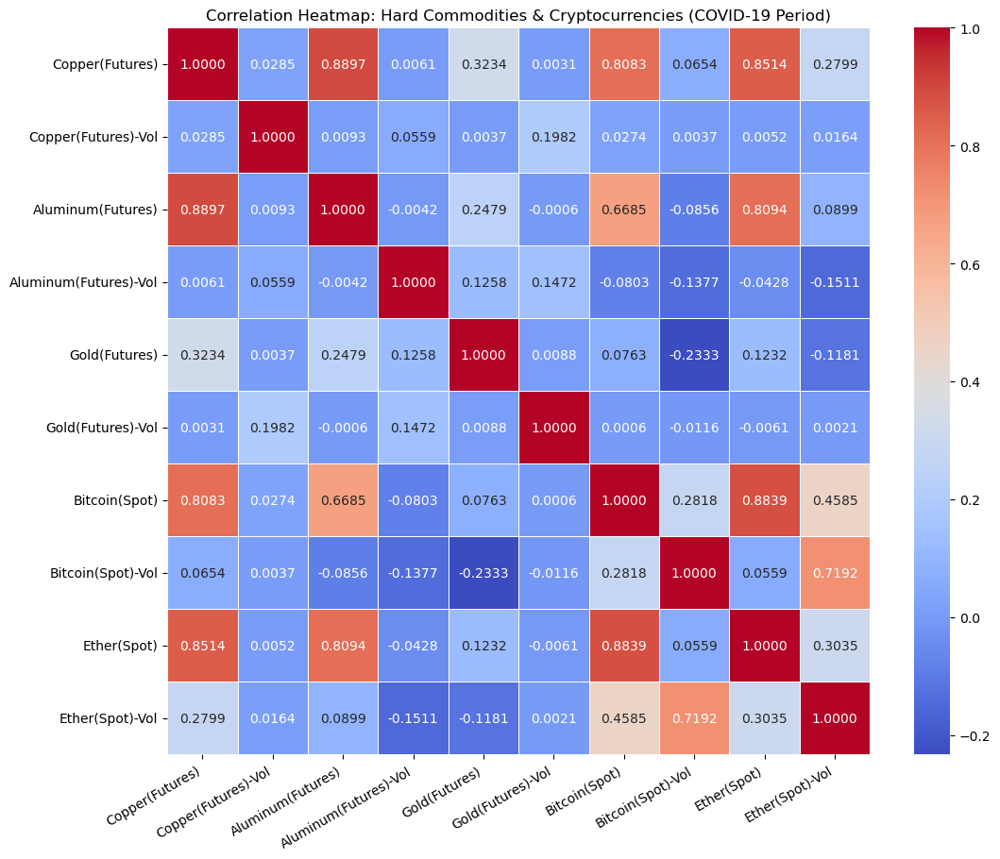

In [243]:
plt.figure(figsize=(12, 10))

heatmap = sns.heatmap(corr_comm_crypto_covid, annot=True,fmt=".4f",cmap='coolwarm', linewidths=0.5)

tick_labels = ["Copper(Futures)", "Copper(Futures)-Vol", "Aluminum(Futures)", "Aluminum(Futures)-Vol",
               "Gold(Futures)", "Gold(Futures)-Vol",
                "Bitcoin(Spot)", "Bitcoin(Spot)-Vol", "Ether(Spot)", "Ether(Spot)-Vol"]

heatmap.set_xticklabels(tick_labels, rotation=30,ha='right')
heatmap.set_yticklabels(tick_labels, rotation=0)

plt.title('Correlation Heatmap: Hard Commodities & Cryptocurrencies (COVID-19 Period)')

plt.savefig('outputs/heatmap_crypto_comm_covid.png', dpi=300)

plt.show()

In [244]:
# Calculate the correlation difference
# dataframe 1 = corr_comm_crypto_covid: Mar 2020 ~ May 2023
# dataframe 2 = corr_comm_crypto_5yr: Nov 2019 ~ Nov 2024
comparison_matrix_commCrypto1 = compare_correlation(corr_comm_crypto_covid, corr_comm_crypto_5yr)
comparison_matrix_commCrypto1

,close_cop,volume_cop,close_alu,volume_alu,close_gold,volume_gold,close_b,volume_b,close_eth,volume_eth
close_cop,Same,High,High,Low,Low,High,High,Low,Low,High
volume_cop,High,Same,High,Low,High,Low,High,Low,Low,Low
close_alu,High,High,Same,High,High,High,High,Low,High,Low
volume_alu,Low,Low,High,Same,Low,High,Low,High,Low,High
close_gold,Low,High,High,Low,Same,High,Low,Low,Low,Low
volume_gold,High,Low,High,High,High,Same,Low,Low,Low,Low
close_b,High,High,High,Low,Low,Low,Same,Low,High,High
volume_b,Low,Low,Low,High,Low,Low,Low,Same,Low,Low
close_eth,Low,Low,High,Low,Low,Low,High,Low,Same,High
volume_eth,High,Low,Low,High,Low,Low,High,Low,High,Same


In [245]:
comparison_matrix_commCrypto1.to_csv("outputs/matrix_comm_crypto_covid5Yr.csv", index=True)

In [246]:
plot_comm_vs_factor(
    comm_value='close_cop', 
    comm_label='Copper Futures Close Price',
    factor_value='close_b', 
    factor_label='Bitcoin Spot Price',
    factor_unit = 'USD',
    time_frame = 'From Mar-2020 to May-2023',
    factor_df=comm_crypto_df_covid, 
    comm_df=comm_crypto_df_covid,
)

Quick Summary
--------------
The Pearson correlation between Copper Futures Close Price and Bitcoin Spot Price is: 0.808
The slope of the Copper Futures Close Price trendline is: 2.386595
The slope of the Bitcoin Spot Price trendline is: 8.401279


In [247]:
plot_comm_vs_factor(
    comm_value='close_alu', 
    comm_label='Aluminum Futures Close Price',
    factor_value='close_eth', 
    factor_label='Ether Spot Price',
    factor_unit = 'USD',
    time_frame = 'From Mar-2020 to May-2023',
    factor_df=comm_crypto_df_covid, 
    comm_df=comm_crypto_df_covid
)

Quick Summary
--------------
The Pearson correlation between Aluminum Futures Close Price and Ether Spot Price is: 0.809
The slope of the Aluminum Futures Close Price trendline is: 0.834319
The slope of the Ether Spot Price trendline is: 1.338582


### 4.2.3 Post-COVID Period: Jun 2023 – Nov 2024  

In [248]:
start_date = '2023-06-01'
end_date = '2024-11-30'


comm_crypto_df_pcovid = pd.merge(comm_daily_df[(comm_daily_df['date'] >= start_date) & (comm_daily_df['date'] <= end_date)], 
                     crypto_spot_df[(crypto_spot_df['date'] >= start_date) & (crypto_spot_df['date'] <= end_date)], 
                     on='date', how='left')

comm_crypto_df_pcovid.tail()

,date,close_cop,volume_cop,close_alu,volume_alu,close_gold,volume_gold,close_b,volume_b,close_eth,volume_eth
373,2024-11-22,8981.621619,514,2556.00,0.0,2709.899902,41.0,98997.664062,78473580551,3331.600830,36775716442
374,2024-11-25,9020.202301,335,2580.75,0.0,2616.800049,94.0,93102.296875,80909462490,3413.543945,51544793988
375,2024-11-26,8904.460256,37274,2555.25,14.0,2620.300049,177858.0,91985.320312,91656519855,3326.517334,39902959158
376,2024-11-27,8966.189347,11425,2556.50,0.0,2639.899902,61653.0,95962.531250,71133452438,3657.249268,43383987191
377,2024-11-29,8995.952188,1274,2562.00,12.0,2657.000000,3861.0,97461.523438,54968682476,3593.494385,27622629486


In [250]:
corr_comm_crypto_pcovid = comm_crypto_df_pcovid.drop(columns=['date']).corr()
corr_comm_crypto_pcovid

,close_cop,volume_cop,close_alu,volume_alu,close_gold,volume_gold,close_b,volume_b,close_eth,volume_eth
close_cop,1.000000,0.030792,0.841400,-0.206770,0.744542,-0.004711,0.707680,0.287633,0.688881,0.364940
volume_cop,0.030792,1.000000,0.046162,0.133706,0.022668,0.292274,0.056017,0.052806,0.055159,0.036742
close_alu,0.841400,0.046162,1.000000,-0.192806,0.783928,0.008522,0.711409,0.363566,0.536901,0.398364
volume_alu,-0.206770,0.133706,-0.192806,1.000000,-0.146373,-0.001705,-0.202322,-0.134512,-0.196204,-0.152817
close_gold,0.744542,0.022668,0.783928,-0.146373,1.000000,0.010545,0.853687,0.551393,0.582794,0.572758
volume_gold,-0.004711,0.292274,0.008522,-0.001705,0.010545,1.000000,0.070956,0.037152,0.077509,0.037963
close_b,0.707680,0.056017,0.711409,-0.202322,0.853687,0.070956,1.000000,0.732682,0.873198,0.749052
volume_b,0.287633,0.052806,0.363566,-0.134512,0.551393,0.037152,0.732682,1.000000,0.577993,0.939606
close_eth,0.688881,0.055159,0.536901,-0.196204,0.582794,0.077509,0.873198,0.577993,1.000000,0.632096
volume_eth,0.364940,0.036742,0.398364,-0.152817,0.572758,0.037963,0.749052,0.939606,0.632096,1.000000


In [251]:
# Correlation significance test: Post-COVID period
correlations_comm_crypto_pcovid = {'Gold(Futures) v.s. Copper(Futures)': corr_comm_crypto_pcovid.iloc[4,0],
                'Gold(Futures) v.s. Aluminum(Futures)': corr_comm_crypto_pcovid.iloc[4,2],
               'Gold(Futures) v.s. Bitcoin(Spot)': corr_comm_crypto_pcovid.iloc[4,6],
                'Gold(Futures) v.s. Ether(Spot)': corr_comm_crypto_pcovid.iloc[4,8],
                'Gold(Futures) v.s. Copper(Futures)-Vol': corr_comm_crypto_pcovid.iloc[4,1]
               }

n = len(corr_comm_crypto_pcovid)

corr_statsig(correlations_comm_crypto_pcovid, n)

Gold(Futures) v.s. Copper(Futures):
  Correlation (r): 0.7445
  t-statistic: 3.1545
  p-value: 0.0135
  Significant: Yes
--------------------------------------------------
Gold(Futures) v.s. Aluminum(Futures):
  Correlation (r): 0.7839
  t-statistic: 3.5714
  p-value: 0.0073
  Significant: Yes
--------------------------------------------------
Gold(Futures) v.s. Bitcoin(Spot):
  Correlation (r): 0.8537
  t-statistic: 4.6364
  p-value: 0.0017
  Significant: Yes
--------------------------------------------------
Gold(Futures) v.s. Ether(Spot):
  Correlation (r): 0.5828
  t-statistic: 2.0285
  p-value: 0.0770
  Significant: No
--------------------------------------------------
Gold(Futures) v.s. Copper(Futures)-Vol:
  Correlation (r): 0.0227
  t-statistic: 0.0641
  p-value: 0.9504
  Significant: No
--------------------------------------------------


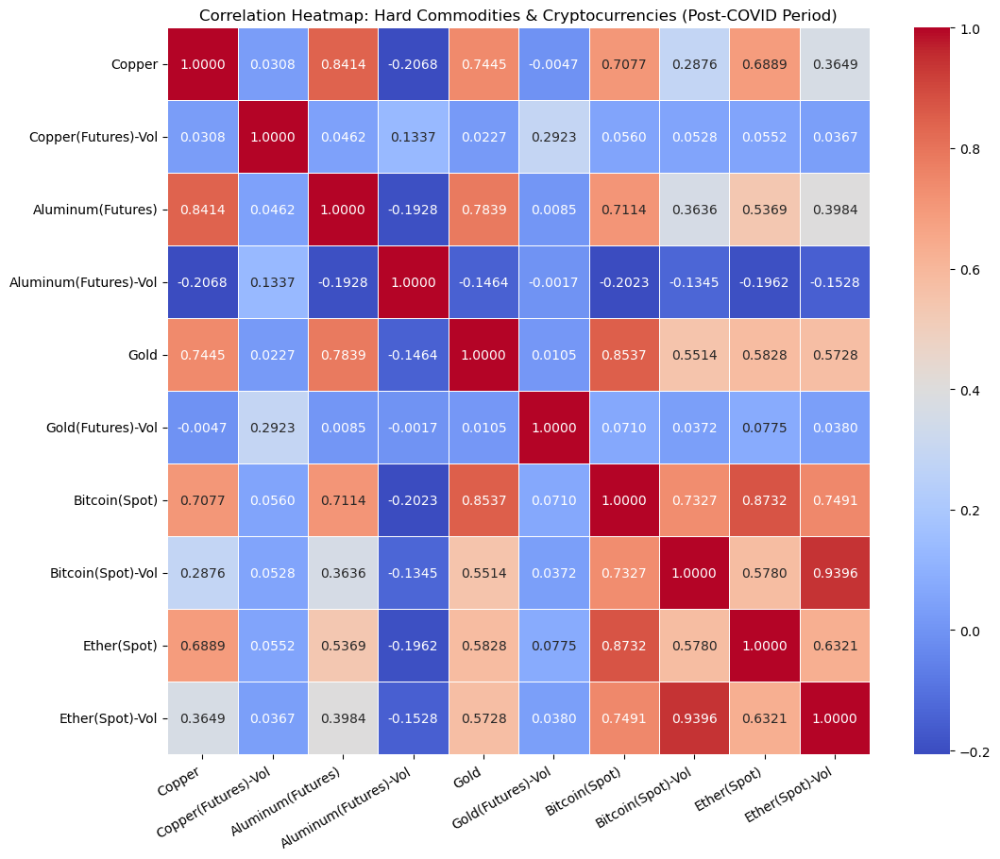

In [252]:
plt.figure(figsize=(12, 10))

heatmap = sns.heatmap(corr_comm_crypto_pcovid, annot=True,fmt=".4f",cmap='coolwarm', linewidths=0.5)

tick_labels = ["Copper", "Copper(Futures)-Vol", "Aluminum(Futures)", "Aluminum(Futures)-Vol",
               "Gold", "Gold(Futures)-Vol",
                "Bitcoin(Spot)", "Bitcoin(Spot)-Vol", "Ether(Spot)", "Ether(Spot)-Vol"]

heatmap.set_xticklabels(tick_labels, rotation=30,ha='right')
heatmap.set_yticklabels(tick_labels, rotation=0)

plt.title('Correlation Heatmap: Hard Commodities & Cryptocurrencies (Post-COVID Period)')

plt.savefig('outputs/heatmap_crypto_comm_postCovid.png', dpi=300)

plt.show()

In [253]:
# Calculate the correlation difference
# dataframe 1 = corr_comm_crypto_pcovid: Jun 2023 ~ Nov 2024
# dataframe 2 = corr_comm_crypto_covid: Mar 2020 ~ May 2023
comparison_matrix_commCrypto2 = compare_correlation(corr_comm_crypto_pcovid, corr_comm_crypto_covid)
comparison_matrix_commCrypto2

,close_cop,volume_cop,close_alu,volume_alu,close_gold,volume_gold,close_b,volume_b,close_eth,volume_eth
close_cop,Same,High,Low,Low,High,Low,Low,High,Low,High
volume_cop,High,Same,High,High,High,High,High,High,High,High
close_alu,Low,High,Same,Low,High,High,High,High,Low,High
volume_alu,Low,High,Low,Same,Low,Low,Low,High,Low,Low
close_gold,High,High,High,Low,Same,High,High,High,High,High
volume_gold,Low,High,High,Low,High,Same,High,High,High,High
close_b,Low,High,High,Low,High,High,Same,High,Low,High
volume_b,High,High,High,High,High,High,High,Same,High,High
close_eth,Low,High,Low,Low,High,High,Low,High,Same,High
volume_eth,High,High,High,Low,High,High,High,High,High,Same


In [254]:
comparison_matrix_commCrypto2.to_csv("outputs/matrix_comm_crypto_pcovidCovid.csv", index=True)

In [255]:
plot_comm_vs_factor(
    comm_value='close_cop', 
    comm_label='Copper Futures Close Price',
    factor_value='close_b', 
    factor_label='Bitcoin Spot Price',
    factor_unit = 'USD',
    time_frame = 'From Jun-2023 to Nov-2024',
    factor_df=comm_crypto_df_pcovid, 
    comm_df=comm_crypto_df_pcovid
)

Quick Summary
--------------
The Pearson correlation between Copper Futures Close Price and Bitcoin Spot Price is: 0.708
The slope of the Copper Futures Close Price trendline is: 3.2826
The slope of the Bitcoin Spot Price trendline is: 102.009525


In [256]:
plot_comm_vs_factor(
    comm_value='close_alu', 
    comm_label='Aluminum Futures Close Price',
    factor_value='close_eth', 
    factor_label='Ether Spot Price',
    factor_unit = 'USD',
    time_frame = 'From Jun-2023 to Nov-2024',
    factor_df=comm_crypto_df_covid, 
    comm_df=comm_crypto_df_covid
)

Quick Summary
--------------
The Pearson correlation between Aluminum Futures Close Price and Ether Spot Price is: 0.809
The slope of the Aluminum Futures Close Price trendline is: 0.834319
The slope of the Ether Spot Price trendline is: 1.338582


## 4.3 Seasonality 
---
- Analysis Focus:
    - **Period**: December 2021 to November 2024
    - **Metrics Analyzed**:
        1. Average Monthly Values- 
        2. Month-over-Month (MoM) Changes

In [257]:
comm_daily_df_3yr = comm_daily_df[(comm_daily_df['date'] >= '2021-12-01')&
                                  (comm_daily_df['date'] <= '2024-11-29')].reset_index(drop=True)

comm_crypto_df_3yr = pd.merge(comm_daily_df_3yr,crypto_3yrs_full, on='date', how='left')
comm_crypto_df_3yr.head()

,date,close_cop,volume_cop,close_alu,volume_alu,close_gold,volume_gold,close_b,volume_b,close_eth,volume_eth,close_b_f,volume_b_f,close_eth_f,volume_eth_f
0,2021-12-01,9364.123324,1392,2628.50,0.0,1781.599976,1128.0,57229.828125,36858195307,4586.990234,27634826695,56990.0,6552,4594.50,5468
1,2021-12-02,9477.660909,834,2585.25,0.0,1760.699951,1557.0,56477.816406,32379968686,4511.302246,21502671027,57175.0,5835,4543.25,5197
2,2021-12-03,9406.011222,891,2596.25,0.0,1782.000000,694.0,53598.246094,39789134215,4220.706055,25879591528,53545.0,11175,4214.00,6550
3,2021-12-06,9561.436705,712,2566.75,0.0,1777.500000,381.0,50582.625000,37707308001,4358.737305,28229518513,48960.0,9344,4206.50,4634
4,2021-12-07,9563.641165,887,2601.75,0.0,1782.599976,308.0,50700.085938,33676814852,4315.061523,22366213354,50600.0,4985,4298.50,2832


In [258]:
copied_season_df = comm_crypto_df_3yr.copy()

In [259]:
copied_season_df['Year'] = pd.to_datetime(copied_season_df['date']).dt.year
copied_season_df['Month'] = pd.to_datetime(copied_season_df['date']).dt.month
copied_season_df.head()

,date,close_cop,volume_cop,close_alu,volume_alu,close_gold,volume_gold,close_b,volume_b,close_eth,volume_eth,close_b_f,volume_b_f,close_eth_f,volume_eth_f,Year,Month
0,2021-12-01,9364.123324,1392,2628.50,0.0,1781.599976,1128.0,57229.828125,36858195307,4586.990234,27634826695,56990.0,6552,4594.50,5468,2021,12
1,2021-12-02,9477.660909,834,2585.25,0.0,1760.699951,1557.0,56477.816406,32379968686,4511.302246,21502671027,57175.0,5835,4543.25,5197,2021,12
2,2021-12-03,9406.011222,891,2596.25,0.0,1782.000000,694.0,53598.246094,39789134215,4220.706055,25879591528,53545.0,11175,4214.00,6550,2021,12
3,2021-12-06,9561.436705,712,2566.75,0.0,1777.500000,381.0,50582.625000,37707308001,4358.737305,28229518513,48960.0,9344,4206.50,4634,2021,12
4,2021-12-07,9563.641165,887,2601.75,0.0,1782.599976,308.0,50700.085938,33676814852,4315.061523,22366213354,50600.0,4985,4298.50,2832,2021,12


In [260]:
# Commodities: Daily Close Prices - 2024 (Jan-Nov)
fig = plot_dual_y_axis(
    df=copied_season_df,
    years = [2024],
    x_column='date',
    primary_y_columns=['close_cop', 'close_alu'],
    secondary_y_columns=['close_gold'],
    primary_y_label='Copper and Aluminium Prices (USD/Per Metric Ton)',
    secondary_y_label='Gold Prices (USD/Per Troy Ounce)',
    title='Copper, Aluminium, and Gold Futures Close Prices (Jan 2024 - Nov 2024)',
    legend_labels=['Copper', 'Aluminium', 'Gold']
)

In [261]:
def calculate_MoM_change(target_columns, df, agg_function):

    if not all(col in df.columns for col in target_columns):
        raise ValueError("One or more target columns are not in the DataFrame")
    
    if not hasattr(pd.core.groupby.DataFrameGroupBy, agg_function):
        raise ValueError(f"Invalid aggregation function: '{agg_function}'")
        
    seasonal_df = df.groupby(['Year', 'Month'])[target_columns].agg(agg_function).reset_index()
    
    for column in target_columns:
        seasonal_df[f'{column}_MoM'] = seasonal_df[column].pct_change(periods=1) * 100

    return seasonal_df

In [262]:
def plot_monthly_values(variables, seasonal_df, year,title_name,legend_labels=None):


    filtered_df = seasonal_df[seasonal_df['Year'] == year]
    
    if legend_labels is None:
        legend_labels = variables
    elif len(legend_labels) != len(variables):
        raise ValueError("The number of legend_labels must match the number of target_columns.")
    

    fig = go.Figure()
    
    for column, legend_label in zip(variables, legend_labels):
        fig.add_trace(go.Scatter(
            x=filtered_df['Month'],
            y=filtered_df[column],
            mode='lines+markers',
            name=legend_label
        ))
    
    fig.update_layout(
        title=f"Average Monthly Value of {title_name}",
        xaxis=dict(
            title='Month',
            tickmode='linear',
            tick0=1,
            dtick=1
        ),
        yaxis_title='Average Monthly Close Price($)',
        template='plotly_white'
    )
    
    fig.show()

In [263]:
def plot_MoM_pct_change(variables, seasonal_df, year,title_name,legend_labels=None):


    filtered_df = seasonal_df[seasonal_df['Year'] == year]
    
    if legend_labels is None:
        legend_labels = variables
    elif len(legend_labels) != len(variables):
        raise ValueError("The number of legend_labels must match the number of target_columns.")
    

    fig = go.Figure()
    
    for column, legend_label in zip(variables, legend_labels):
        fig.add_trace(go.Scatter(
            x=filtered_df['Month'],
            y=filtered_df[column],
            mode='lines+markers',
            name=legend_label
        ))
    
    fig.update_layout(
        title=f"Month-over-Month (MoM) Percentage Change in {title_name}",
        xaxis=dict(
            title='Month',
            tickmode='linear',
            tick0=1,
            dtick=1
        ),
        yaxis_title='MoM Percentage Change',
        template='plotly_white'
    )
    
    fig.show()

In [149]:
# Commodities MoM percentage change
target_columns = ['close_cop', 'close_alu', 'close_gold']
seasonal_comm = calculate_MoM_change(target_columns, copied_season_df, 'mean')
seasonal_comm.head()

,Year,Month,close_cop,close_alu,close_gold,close_cop_MoM,close_alu_MoM,close_gold_MoM
0,2021,12,9552.618434,2660.159091,1791.045443,NaN,NaN,NaN
1,2022,1,9768.946739,2978.575000,1816.639996,2.264597,11.969807,1.429029
2,2022,2,9925.431356,3267.157895,1857.742091,1.601858,9.688623,2.262534
3,2022,3,10322.653896,3490.173913,1950.673902,4.002068,6.825995,5.002407
4,2022,4,10224.200781,3235.487500,1933.930005,-0.953758,-7.297241,-0.858365


In [264]:
# Commodities: Average Monthly Futures Prices - 2024 (Jan-Nov)
fig = plot_dual_y_axis(
    df=seasonal_comm,
    years = [2024],
    x_column='Month',
    primary_y_columns=['close_cop', 'close_alu'],
    secondary_y_columns=['close_gold'],
    primary_y_label='Copper and Aluminium Prices (USD/Per Metric Ton)',
    secondary_y_label='Gold Prices (USD/Per Troy Ounce)',
    title='Copper, Aluminium, and Gold Monthly Futures Close Prices (Jan 2024 - Nov 2024)',
    legend_labels=['Copper', 'Aluminium', 'Gold']
)

In [265]:
# Commodities: MoM percentage change - 2023
variables = ['close_cop_MoM', 'close_alu_MoM', 'close_gold_MoM']
legend_labels = ['Copper(Futures)', 'Aluminum(Futures)', 'Gold(Futures)']


plot_MoM_pct_change(
    variables=variables,
    seasonal_df=seasonal_comm,
    year=2023,
    legend_labels=legend_labels,
    title_name="Hard Commodities (2023)"
)

In [266]:
# Commodities - Correlation Table: three years (Dec 2021 - Nov 2024)
seasonal_comm.drop(columns=['Year','Month']).corr()

,close_cop,close_alu,close_gold,close_cop_MoM,close_alu_MoM,close_gold_MoM
close_cop,1.000000,0.712023,0.472770,0.286836,0.250810,0.316770
close_alu,0.712023,1.000000,-0.061792,0.103852,0.243443,0.095432
close_gold,0.472770,-0.061792,1.000000,0.109501,0.201421,0.348513
close_cop_MoM,0.286836,0.103852,0.109501,1.000000,0.646723,0.704367
close_alu_MoM,0.250810,0.243443,0.201421,0.646723,1.000000,0.659650
close_gold_MoM,0.316770,0.095432,0.348513,0.704367,0.659650,1.000000


In [267]:
# Commodities - Correlation Table: target year
seasonal_comm[seasonal_comm['Year'] == 2022].drop(columns=['Year','Month']).corr()

,close_cop,close_alu,close_gold,close_cop_MoM,close_alu_MoM,close_gold_MoM
close_cop,1.000000,0.952133,0.932649,0.251968,0.242570,0.367260
close_alu,0.952133,1.000000,0.912607,0.178306,0.319007,0.351142
close_gold,0.932649,0.912607,1.000000,0.167920,0.077945,0.355996
close_cop_MoM,0.251968,0.178306,0.167920,1.000000,0.633402,0.872308
close_alu_MoM,0.242570,0.319007,0.077945,0.633402,1.000000,0.750908
close_gold_MoM,0.367260,0.351142,0.355996,0.872308,0.750908,1.000000


In [268]:
# Cryptocurrencies MoM change
target_columns = ['close_b', 'close_eth', 'close_b_f','close_eth_f']
seasonal_crypto = calculate_MoM_change(target_columns, copied_season_df, 'mean')
seasonal_crypto.head()

,Year,Month,close_b,close_eth,close_b_f,close_eth_f,close_b_MoM,close_eth_MoM,close_b_f_MoM,close_eth_f_MoM
0,2021,12,49250.533026,4034.461659,49537.819602,4055.234086,NaN,NaN,NaN,NaN
1,2022,1,40998.242773,3040.539648,41080.544531,3050.703503,-16.755738,-24.635803,-17.072360,-24.771211
2,2022,2,41086.207442,2898.262181,41031.688939,2888.894210,0.214557,-4.679349,-0.118926,-5.303999
3,2022,3,42244.318274,2896.155327,42244.521739,2899.015222,2.818734,-0.072694,2.955844,0.350342
4,2022,4,41419.073242,3089.012427,41461.866992,3093.923999,-1.953505,6.659073,-1.852677,6.723275


In [269]:
# Cryptocurrencies: Average Monthly Futures Prices - 2024 (Jan-Nov)

variables = ['close_b', 'close_eth']
legend_labels = ['Bitcoin(Spot)', 'Ether(Spot)']


plot_monthly_values(
    variables=variables,
    seasonal_df=seasonal_crypto,
    year=2024,
    legend_labels=legend_labels,
    title_name="Cryptocurrencies Spot Price"
)

In [270]:
# Commodities: MoM percentage change - 2024 (Jan-Nov)
variables = ['close_b_MoM', 'close_eth_MoM']
legend_labels = ['Bitcoin(Spot)', 'Ether(Spot)']

plot_MoM_pct_change(
    variables=variables,
    seasonal_df=seasonal_crypto,
    year=2024,
    legend_labels=legend_labels,
    title_name="Cryptocurrencies(Jan 2024 - Nov 2024)"
)

In [271]:
# Volume(Cryptocurrencies[SPOT] & Hard Commodities) MoM change
target_columns = ['volume_b', 'volume_eth', 'volume_cop','volume_alu','volume_gold','volume_b_f','volume_eth_f']
seasonal_vol = calculate_MoM_change(target_columns, copied_season_df, 'sum')
seasonal_vol.tail(12)

,Year,Month,volume_b,volume_eth,volume_cop,volume_alu,volume_gold,volume_b_f,volume_eth_f,volume_b_MoM,volume_eth_MoM,volume_cop_MoM,volume_alu_MoM,volume_gold_MoM,volume_b_f_MoM,volume_eth_f_MoM
24,2023,12,543101483723,262744415795,15971,454.0,8723.0,181400,104836,17.667028,6.414596,-68.172579,1.793722,-95.637737,-16.505569,-13.992009
25,2024,1,662412726857,292368766644,9910,762.0,184110.0,264258,124005,21.968499,11.274969,-37.950034,67.841410,2010.627078,45.676957,18.284750
26,2024,2,679481873402,329721063279,39340,426.0,10440.0,208644,103853,2.576814,12.775748,296.972755,-44.094488,-94.329477,-21.045342,-16.250958
27,2024,3,1133065238711,518587891682,18033,343.0,241903.0,255080,90127,66.754300,57.280790,-54.161159,-19.483568,2217.078544,22.256092,-13.216758
28,2024,4,792471815914,363861059125,77579,179.0,8117.0,224665,78819,-30.059472,-29.836183,330.205734,-47.813411,-96.644523,-11.923710,-12.546740
29,2024,5,714798266448,403186305896,19419,67.0,154217.0,188178,101418,-9.801427,10.807765,-74.968742,-62.569832,1799.926081,-16.240625,28.672021
30,2024,6,570705037243,295302220502,43154,404.0,7958.0,171196,83139,-20.158587,-26.757874,122.225655,502.985075,-94.839739,-9.024434,-18.023428
31,2024,7,733361962437,386683039569,14837,231.0,155434.0,220878,100217,28.501050,30.944847,-65.618483,-42.821782,1853.179191,29.020538,20.541503
32,2024,8,857095910974,430158687713,38667,531.0,12103.0,250529,89872,16.872152,11.243226,160.611984,129.870130,-92.213415,13.424153,-10.322600
33,2024,9,690986052300,328297026402,13126,911.0,24007.0,220696,75428,-19.380545,-23.680020,-66.053741,71.563089,98.355780,-11.908003,-16.071746


In [272]:
test_corr_vol = seasonal_vol[seasonal_vol['Year'] == 2024].drop(columns=['Year','Month']).corr()
test_corr_vol

,volume_b,volume_eth,volume_cop,volume_alu,volume_gold,volume_b_f,volume_eth_f,volume_b_MoM,volume_eth_MoM,volume_cop_MoM,volume_alu_MoM,volume_gold_MoM,volume_b_f_MoM,volume_eth_f_MoM
volume_b,1.000000,0.982095,0.307863,-0.250476,0.601588,0.791385,0.693391,0.840087,0.803336,0.400437,-0.057841,0.787971,0.439172,0.614267
volume_eth,0.982095,1.000000,0.278277,-0.351626,0.600500,0.709095,0.682149,0.822984,0.820576,0.355765,-0.067509,0.791828,0.388601,0.661784
volume_cop,0.307863,0.278277,1.000000,-0.282737,-0.214209,0.092443,0.113499,-0.112831,-0.154719,0.907184,0.241811,0.036903,-0.265377,-0.048629
volume_alu,-0.250476,-0.351626,-0.282737,1.000000,-0.111127,0.152952,-0.121649,-0.148830,-0.308128,-0.180347,0.300407,-0.161176,0.153045,-0.394277
volume_gold,0.601588,0.600500,-0.214209,-0.111127,1.000000,0.566813,0.643399,0.754884,0.753017,-0.203038,-0.143054,0.902615,0.684973,0.575543
volume_b_f,0.791385,0.709095,0.092443,0.152952,0.566813,1.000000,0.683079,0.796206,0.693571,0.252658,-0.180563,0.668710,0.743782,0.518722
volume_eth_f,0.693391,0.682149,0.113499,-0.121649,0.643399,0.683079,1.000000,0.719754,0.723662,0.339915,0.009832,0.854011,0.573016,0.840943
volume_b_MoM,0.840087,0.822984,-0.112831,-0.148830,0.754884,0.796206,0.719754,1.000000,0.965693,0.069045,-0.110993,0.792412,0.729911,0.601111
volume_eth_MoM,0.803336,0.820576,-0.154719,-0.308128,0.753017,0.693571,0.723662,0.965693,1.000000,0.037918,-0.262303,0.784234,0.615300,0.663966
volume_cop_MoM,0.400437,0.355765,0.907184,-0.180347,-0.203038,0.252658,0.339915,0.069045,0.037918,1.000000,0.189656,0.105263,-0.181143,0.064878


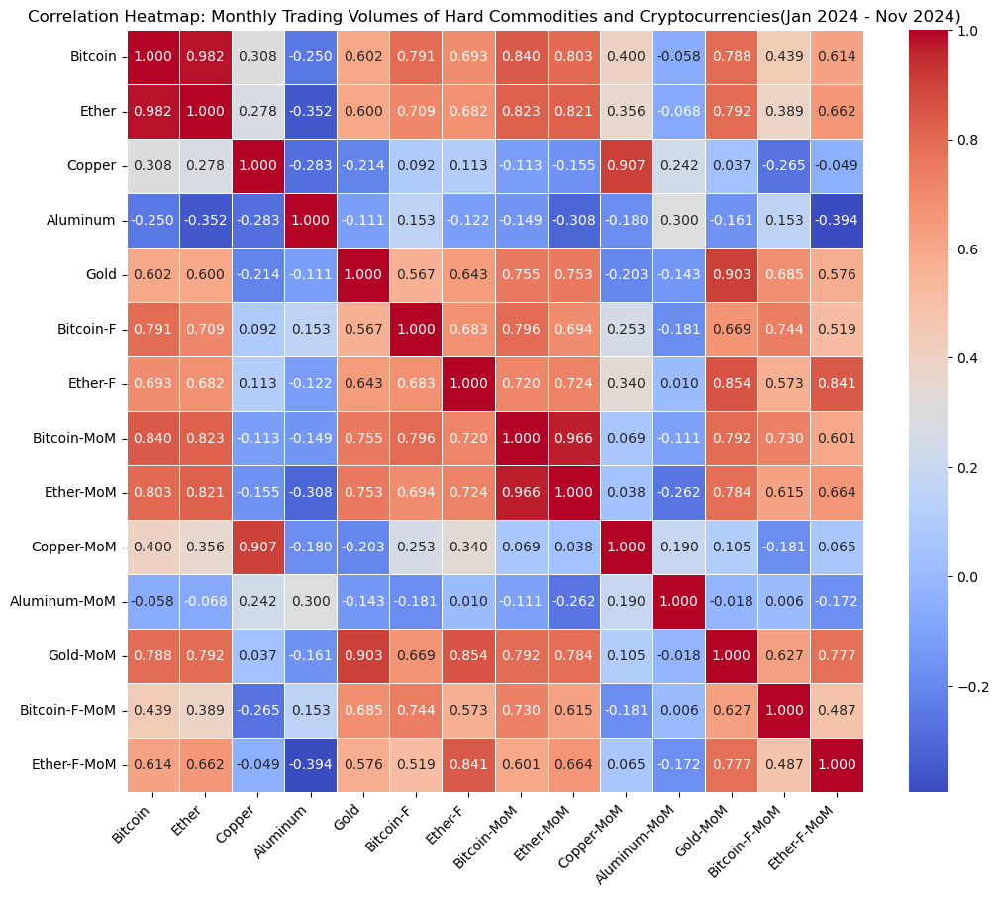

In [273]:
plt.figure(figsize=(12, 10))
heatmap = sns.heatmap(test_corr_vol, annot=True, fmt=".3f", cmap='coolwarm', linewidths=0.5)

tick_labels = ["Bitcoin","Ether","Copper", "Aluminum", "Gold","Bitcoin-F","Ether-F",
              "Bitcoin-MoM","Ether-MoM","Copper-MoM", "Aluminum-MoM", "Gold-MoM","Bitcoin-F-MoM","Ether-F-MoM"]
heatmap.set_xticklabels(tick_labels, rotation=45,ha='right')
heatmap.set_yticklabels(tick_labels, rotation=0)

plt.title('Correlation Heatmap: Monthly Trading Volumes of Hard Commodities and Cryptocurrencies(Jan 2024 - Nov 2024)')

plt.savefig('outputs/heatmap_tradingVolumes.png')

plt.show()

In [274]:
# Volume MoM change - 2024 (Jan-Nov)
variables = ['volume_b_MoM', 'volume_eth_MoM']
legend_labels = ['Bitcoin(Spot)-Volume', 'Ether(Spot)-Volume',]


plot_MoM_pct_change(
    variables=variables,
    seasonal_df=seasonal_vol,
    year=2024,
    legend_labels=legend_labels,
    title_name="Volume(Cryptocurrencies)"
)

In [275]:
# Volume: MoM percentage change - 2024 (Jan-Nov)

# variables = ['volume_cop_MoM']
# legend_labels = ['Aluminum(Futures)-Volume']

# variables = ['volume_cop_MoM','volume_alu_MoM']
# legend_labels = ['Copper(Futures)-Volume','Aluminum(Futures)-Volume']

# variables = ['volume_cop_MoM','volume_alu_MoM','volume_gold_MoM','volume_b_MoM']
# legend_labels = ['Copper(Futures)-Volume','Aluminum(Futures)-Volume','Gold(Futures)-Volume','Bitcoin(Spot)-Volume']

variables = ['volume_gold_MoM','volume_b_MoM']
legend_labels = ['Gold(Futures)-Volume','Bitcoin(Spot)-Volume']

# variables = ['volume_alu_MoM','volume_gold_MoM','volume_b_MoM']
# legend_labels = ['Alu(Futures)-Volume','Gold(Futures)-Volume','Bitcoin(Futures)-Volume']


plot_MoM_pct_change(
    variables=variables,
    seasonal_df=seasonal_vol,
    year=2024,
    legend_labels=legend_labels,
    title_name="Volume"
)

In [276]:
variables = ['volume_cop_MoM','volume_alu_MoM','volume_gold_MoM','volume_b_f_MoM']
legend_labels = ['Copper(Futures)-Volume','Aluminum(Futures)-Volume','Gold(Futures)-Volume','Bitcoin(Spot)-Volume']

plot_MoM_pct_change(
    variables=variables,
    seasonal_df=seasonal_vol,
    year=2024,
    legend_labels=legend_labels,
    title_name="Volume"
)

# 5. Supporting Data Analysis  
---  
- **5.1 Variance Test**: Significant differences in variances between copper and aluminum prices  
- **5.2 Histograms**: Copper & Aluminum prices over the past decade  
- **5.3 US Housing Data**: Rent estimates and growth trends  

## 5.1 Variance Test

In [163]:
# Variance Test: Significant Difference Between Copper and Aluminum Prices (Past Decade)
var_copper = np.var(cpi_cop_alu_df['copper_value'], ddof=1)
var_aluminum = np.var(cpi_cop_alu_df['alu_value'], ddof=1)


F_statistic = var_copper / var_aluminum


df_copper = len(cpi_cop_alu_df) - 1
df_aluminum = df_copper

alpha = 0.05


lower_critical_value = f.ppf(alpha / 2, df_copper, df_aluminum)
upper_critical_value = f.ppf(1 - alpha / 2, df_copper, df_aluminum)


print(f"F-statistic: {F_statistic}")
print(f"Lower critical value: {lower_critical_value}")
print(f"Upper critical value: {upper_critical_value}")

if F_statistic < lower_critical_value or F_statistic > upper_critical_value:
    print("Reject the null hypothesis: Variances are significantly different.")
else:
    print("Fail to reject the null hypothesis: Variances are not significantly different.")


F-statistic: 16.462577787114633
Lower critical value: 0.6969327270745552
Upper critical value: 1.4348587190009001
Reject the null hypothesis: Variances are significantly different.


In [164]:
# Variance Test: Significant Difference Between Copper and Aluminum Prices (COVID Period)
var_copper = np.var(cpi_cop_alu_covid['copper_value'], ddof=1)
var_aluminum = np.var(cpi_cop_alu_covid['alu_value'], ddof=1)


F_statistic = var_copper / var_aluminum


df_copper = len(cpi_cop_alu_covid) - 1
df_aluminum = df_copper

alpha = 0.05

lower_critical_value = f.ppf(alpha / 2, df_copper, df_aluminum)
upper_critical_value = f.ppf(1 - alpha / 2, df_copper, df_aluminum)

print(f"F-statistic: {F_statistic}")
print(f"Lower critical value: {lower_critical_value}")
print(f"Upper critical value: {upper_critical_value}")

if F_statistic < lower_critical_value or F_statistic > upper_critical_value:
    print("Reject the null hypothesis: Variances are significantly different.")
else:
    print("Fail to reject the null hypothesis: Variances are not significantly different.")


F-statistic: 8.881472832264187
Lower critical value: 0.5243828442919567
Upper critical value: 1.9070036536955
Reject the null hypothesis: Variances are significantly different.


In [165]:
# Variance Test: if copper's variance is significant higher than aluminum prices (COVID Period)
var_copper = np.var(cpi_cop_alu_covid['copper_value'], ddof=1)
var_aluminum = np.var(cpi_cop_alu_covid['alu_value'], ddof=1)

F_statistic = var_copper / var_aluminum

df_copper = len(cpi_cop_alu_covid) - 1
df_aluminum = df_copper

alpha = 0.05


upper_critical_value = f.ppf(1 - alpha, df_copper, df_aluminum)


print(f"F-statistic: {F_statistic}")
print(f"Critical value: {upper_critical_value}")


if F_statistic > upper_critical_value:
    print("Reject the null hypothesis: Variance of copper is significantly higher than that of aluminum.")
else:
    print("Fail to reject the null hypothesis: Variance of copper is not significantly higher than that of aluminum.")

F-statistic: 8.881472832264187
Critical value: 1.7166871444419058
Reject the null hypothesis: Variance of copper is significantly higher than that of aluminum.


## 5.2 Histograms

In [166]:
# Copper prices (Past Decade) 
fig = px.histogram(
    cpi_cop_alu_df,
    x='copper_value',
    nbins=30, 
    title='Histogram of Copper Prices',
    template='plotly_white'
)


fig.update_layout(
    xaxis_title="Copper Price",
    yaxis_title="Frequency",
    bargap=0.1
)

fig.show()

In [167]:
# Aluminum prices (Past Decade)
fig = px.histogram(
    cpi_cop_alu_df,
    x='alu_value',
    nbins=30, 
    title='Histogram of Aluminum Prices',
    template='plotly_white'
)


fig.update_layout(
    xaxis_title="Copper Price",
    yaxis_title="Frequency",
    bargap=0.1
)

fig.show()

## 5.3 US Housing Data  
---  
- **Data Type**:  
    - Rent Estimate  
    - Rent Growth  
- **Data Source**:  
    - [Apartment List](https://www.apartmentlist.com/research/category/data-rent-estimates)  

In [168]:
rent_df = pd.read_csv('resources/historical_rent_estimates.txt', delimiter=',')

In [169]:
rent_df = rent_df[rent_df["bed_size"] == "overall"]
rent_df.head()

,location_name,location_type,location_fips_code,population,state,county,metro,bed_size,2017_01,2017_02,...,2024_02,2024_03,2024_04,2024_05,2024_06,2024_07,2024_08,2024_09,2024_10,2024_11
0,United States,National,0,331097593,NaN,NaN,NaN,overall,1070.0,1071.0,...,1380,1389,1397,1404,1410,1413,1411,1404,1394,1382
3,California,State,6,39356104,California,NaN,NaN,overall,1740.0,1745.0,...,2119,2135,2146,2154,2163,2170,2174,2168,2156,2142
6,Texas,State,48,29243342,Texas,NaN,NaN,overall,1054.0,1051.0,...,1287,1290,1292,1295,1296,1297,1293,1286,1276,1266
9,Florida,State,12,21634529,Florida,NaN,NaN,overall,1074.0,1076.0,...,1543,1550,1555,1558,1558,1555,1551,1543,1537,1529
12,New York,State,36,19994379,New York,NaN,NaN,overall,1429.0,1423.0,...,1808,1826,1843,1867,1883,1892,1888,1874,1853,1840


In [170]:
rent_df_state = rent_df[rent_df["location_type"].isin(['National', 'State'])]
rent_df_state.head()

,location_name,location_type,location_fips_code,population,state,county,metro,bed_size,2017_01,2017_02,...,2024_02,2024_03,2024_04,2024_05,2024_06,2024_07,2024_08,2024_09,2024_10,2024_11
0,United States,National,0,331097593,NaN,NaN,NaN,overall,1070.0,1071.0,...,1380,1389,1397,1404,1410,1413,1411,1404,1394,1382
3,California,State,6,39356104,California,NaN,NaN,overall,1740.0,1745.0,...,2119,2135,2146,2154,2163,2170,2174,2168,2156,2142
6,Texas,State,48,29243342,Texas,NaN,NaN,overall,1054.0,1051.0,...,1287,1290,1292,1295,1296,1297,1293,1286,1276,1266
9,Florida,State,12,21634529,Florida,NaN,NaN,overall,1074.0,1076.0,...,1543,1550,1555,1558,1558,1555,1551,1543,1537,1529
12,New York,State,36,19994379,New York,NaN,NaN,overall,1429.0,1423.0,...,1808,1826,1843,1867,1883,1892,1888,1874,1853,1840


In [171]:
# Note: Maine,Vermont, West virginia, are three missed states and remove District of Columbia
print(rent_df_state[rent_df_state["location_type"]=="State"]["location_name"].unique())

['California' 'Texas' 'Florida' 'New York' 'Pennsylvania' 'Illinois'
 'Ohio' 'Georgia' 'North Carolina' 'Michigan' 'New Jersey' 'Virginia'
 'Washington' 'Arizona' 'Massachusetts' 'Tennessee' 'Indiana' 'Maryland'
 'Missouri' 'Wisconsin' 'Colorado' 'Minnesota' 'South Carolina' 'Alabama'
 'Louisiana' 'Kentucky' 'Oregon' 'Oklahoma' 'Connecticut' 'Utah' 'Iowa'
 'Nevada' 'Arkansas' 'Mississippi' 'Kansas' 'New Mexico' 'Nebraska'
 'Idaho' 'Hawaii' 'New Hampshire' 'Rhode Island' 'Montana' 'Delaware'
 'South Dakota' 'North Dakota' 'Alaska' 'District of Columbia' 'Wyoming']


In [172]:
rent_state_f = rent_df_state[rent_df_state['location_name'] != 'District of Columbia']
rent_state_f.head()

,location_name,location_type,location_fips_code,population,state,county,metro,bed_size,2017_01,2017_02,...,2024_02,2024_03,2024_04,2024_05,2024_06,2024_07,2024_08,2024_09,2024_10,2024_11
0,United States,National,0,331097593,NaN,NaN,NaN,overall,1070.0,1071.0,...,1380,1389,1397,1404,1410,1413,1411,1404,1394,1382
3,California,State,6,39356104,California,NaN,NaN,overall,1740.0,1745.0,...,2119,2135,2146,2154,2163,2170,2174,2168,2156,2142
6,Texas,State,48,29243342,Texas,NaN,NaN,overall,1054.0,1051.0,...,1287,1290,1292,1295,1296,1297,1293,1286,1276,1266
9,Florida,State,12,21634529,Florida,NaN,NaN,overall,1074.0,1076.0,...,1543,1550,1555,1558,1558,1555,1551,1543,1537,1529
12,New York,State,36,19994379,New York,NaN,NaN,overall,1429.0,1423.0,...,1808,1826,1843,1867,1883,1892,1888,1874,1853,1840


In [173]:
rent_df_long = rent_state_f.melt(
    id_vars=['location_name', 'location_type', 'location_fips_code', 'population', 'state', 'county', 'metro', 'bed_size'],
    var_name='year_month', 
    value_name='rent_amount'
)

final_rent_df = rent_df_long[
    ['location_name', 'location_type', 'location_fips_code', 'population', 
     'state', 'county', 'metro', 'bed_size', 'year_month', 'rent_amount']
]


final_rent_df['date'] = pd.to_datetime(final_rent_df['year_month'] + '_01', format='%Y_%m_%d')

final_rent_df = final_rent_df.drop(columns=['year_month'])


In [174]:
final_rent_df.tail()

,location_name,location_type,location_fips_code,population,state,county,metro,bed_size,rent_amount,date
4555,Delaware,State,10,993635,Delaware,NaN,NaN,overall,1484.0,2024-11-01
4556,South Dakota,State,46,890342,South Dakota,NaN,NaN,overall,869.0,2024-11-01
4557,North Dakota,State,38,776874,North Dakota,NaN,NaN,overall,1105.0,2024-11-01
4558,Alaska,State,2,734821,Alaska,NaN,NaN,overall,1599.0,2024-11-01
4559,Wyoming,State,56,577929,Wyoming,NaN,NaN,overall,1122.0,2024-11-01


In [175]:
final_rent_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4560 entries, 0 to 4559
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   location_name       4560 non-null   object        
 1   location_type       4560 non-null   object        
 2   location_fips_code  4560 non-null   int64         
 3   population          4560 non-null   int64         
 4   state               4465 non-null   object        
 5   county              0 non-null      object        
 6   metro               0 non-null      object        
 7   bed_size            4560 non-null   object        
 8   rent_amount         4548 non-null   float64       
 9   date                4560 non-null   datetime64[ns]
dtypes: datetime64[ns](1), float64(1), int64(2), object(6)
memory usage: 356.4+ KB


In [176]:
fig = px.line(
    final_rent_df[final_rent_df['location_name'].isin(['California','Texas',
                                                    'Florida','New York','Pennsylvania',
                                                   'Illinois','Ohio', 'Georgia', 'North Carolina','Michigan',
                                                   'New Jersey', 'Virginia','Washington','United States'])],
    x='date',
    y='rent_amount',
    color='location_name',
    title='US Rent Estimates (from Jan 2017 to Nov 2024)',
)


fig.update_layout(
    xaxis_title="Date",
    yaxis_title="Monthly Rent Estimates($)",
    legend_title="Location",
    template="plotly_white",
)


for trace in fig.data:
    if trace.name == 'United States':
        trace.line.width = 4
        trace.opacity = 1
    else:
        trace.line.width = 2 
        trace.opacity = 0.3  


fig.show()

In [177]:
rentGrowth_monthly = pd.read_csv('resources/historical_rent_growth.txt', delimiter=',')

In [178]:
rentGrowth_monthly.head()

,location_name,location_type,location_fips_code,population,state,county,metro,2017_02,2017_03,2017_04,...,2024_02,2024_03,2024_04,2024_05,2024_06,2024_07,2024_08,2024_09,2024_10,2024_11
0,United States,National,0,331097593,NaN,NaN,NaN,0.0005,0.0039,0.0071,...,0.0025,0.0062,0.0055,0.0056,0.0040,0.0023,-0.0013,-0.0051,-0.0076,-0.0082
1,California,State,6,39356104,California,NaN,NaN,0.0024,-0.0003,0.0057,...,0.0033,0.0073,0.0054,0.0036,0.0042,0.0032,0.0019,-0.0027,-0.0055,-0.0067
2,Texas,State,48,29243342,Texas,NaN,NaN,-0.0022,0.0004,0.0049,...,0.0003,0.0027,0.0013,0.0024,0.0010,0.0006,-0.0031,-0.0055,-0.0076,-0.0082
3,Florida,State,12,21634529,Florida,NaN,NaN,0.0016,0.0005,0.0051,...,0.0033,0.0047,0.0032,0.0018,-0.0002,-0.0017,-0.0025,-0.0052,-0.0040,-0.0049
4,New York,State,36,19994379,New York,NaN,NaN,-0.0041,0.0004,0.0046,...,0.0011,0.0096,0.0095,0.0131,0.0085,0.0048,-0.0022,-0.0076,-0.0112,-0.0069


In [179]:
# Note: Maine,Vermont, West virginia, are three missed states and remove District of Columbia
print(rentGrowth_monthly[rentGrowth_monthly["location_type"]=="State"]["location_name"].unique())

['California' 'Texas' 'Florida' 'New York' 'Pennsylvania' 'Illinois'
 'Ohio' 'Georgia' 'North Carolina' 'Michigan' 'New Jersey' 'Virginia'
 'Washington' 'Arizona' 'Massachusetts' 'Tennessee' 'Indiana' 'Maryland'
 'Missouri' 'Wisconsin' 'Colorado' 'Minnesota' 'South Carolina' 'Alabama'
 'Louisiana' 'Kentucky' 'Oregon' 'Oklahoma' 'Connecticut' 'Utah' 'Iowa'
 'Nevada' 'Arkansas' 'Mississippi' 'Kansas' 'New Mexico' 'Nebraska'
 'Idaho' 'Hawaii' 'New Hampshire' 'Rhode Island' 'Montana' 'Delaware'
 'South Dakota' 'North Dakota' 'Alaska' 'District of Columbia' 'Wyoming']


In [180]:
rentGrowth_monthly_f = rentGrowth_monthly[rentGrowth_monthly['location_name'] != 'District of Columbia']
rentGrowth_monthly_f.head()


,location_name,location_type,location_fips_code,population,state,county,metro,2017_02,2017_03,2017_04,...,2024_02,2024_03,2024_04,2024_05,2024_06,2024_07,2024_08,2024_09,2024_10,2024_11
0,United States,National,0,331097593,NaN,NaN,NaN,0.0005,0.0039,0.0071,...,0.0025,0.0062,0.0055,0.0056,0.0040,0.0023,-0.0013,-0.0051,-0.0076,-0.0082
1,California,State,6,39356104,California,NaN,NaN,0.0024,-0.0003,0.0057,...,0.0033,0.0073,0.0054,0.0036,0.0042,0.0032,0.0019,-0.0027,-0.0055,-0.0067
2,Texas,State,48,29243342,Texas,NaN,NaN,-0.0022,0.0004,0.0049,...,0.0003,0.0027,0.0013,0.0024,0.0010,0.0006,-0.0031,-0.0055,-0.0076,-0.0082
3,Florida,State,12,21634529,Florida,NaN,NaN,0.0016,0.0005,0.0051,...,0.0033,0.0047,0.0032,0.0018,-0.0002,-0.0017,-0.0025,-0.0052,-0.0040,-0.0049
4,New York,State,36,19994379,New York,NaN,NaN,-0.0041,0.0004,0.0046,...,0.0011,0.0096,0.0095,0.0131,0.0085,0.0048,-0.0022,-0.0076,-0.0112,-0.0069


In [181]:
rentGrowth_monthly_f = rentGrowth_monthly_f[rentGrowth_monthly_f["location_type"].isin(['National', 'State'])]
rentGrowth_monthly_f.head()

,location_name,location_type,location_fips_code,population,state,county,metro,2017_02,2017_03,2017_04,...,2024_02,2024_03,2024_04,2024_05,2024_06,2024_07,2024_08,2024_09,2024_10,2024_11
0,United States,National,0,331097593,NaN,NaN,NaN,0.0005,0.0039,0.0071,...,0.0025,0.0062,0.0055,0.0056,0.0040,0.0023,-0.0013,-0.0051,-0.0076,-0.0082
1,California,State,6,39356104,California,NaN,NaN,0.0024,-0.0003,0.0057,...,0.0033,0.0073,0.0054,0.0036,0.0042,0.0032,0.0019,-0.0027,-0.0055,-0.0067
2,Texas,State,48,29243342,Texas,NaN,NaN,-0.0022,0.0004,0.0049,...,0.0003,0.0027,0.0013,0.0024,0.0010,0.0006,-0.0031,-0.0055,-0.0076,-0.0082
3,Florida,State,12,21634529,Florida,NaN,NaN,0.0016,0.0005,0.0051,...,0.0033,0.0047,0.0032,0.0018,-0.0002,-0.0017,-0.0025,-0.0052,-0.0040,-0.0049
4,New York,State,36,19994379,New York,NaN,NaN,-0.0041,0.0004,0.0046,...,0.0011,0.0096,0.0095,0.0131,0.0085,0.0048,-0.0022,-0.0076,-0.0112,-0.0069


In [182]:
rentGrowth_monthly_long = rentGrowth_monthly_f.melt(
    id_vars=['location_name', 'location_type', 'location_fips_code', 'population', 'state', 'county', 'metro'],
    var_name='year_month', 
    value_name='rent_growth'
)

final_rentGrowth_df = rentGrowth_monthly_long[
    ['location_name', 'location_type', 'location_fips_code', 'population', 
     'state', 'county', 'metro', 'year_month', 'rent_growth']
]

final_rentGrowth_df['date'] = pd.to_datetime(final_rentGrowth_df['year_month'] + '_01', format='%Y_%m_%d')

final_rentGrowth_df = final_rentGrowth_df.drop(columns=['year_month'])

In [183]:
final_rentGrowth_df.head()

,location_name,location_type,location_fips_code,population,state,county,metro,rent_growth,date
0,United States,National,0,331097593,NaN,NaN,NaN,0.0005,2017-02-01
1,California,State,6,39356104,California,NaN,NaN,0.0024,2017-02-01
2,Texas,State,48,29243342,Texas,NaN,NaN,-0.0022,2017-02-01
3,Florida,State,12,21634529,Florida,NaN,NaN,0.0016,2017-02-01
4,New York,State,36,19994379,New York,NaN,NaN,-0.0041,2017-02-01


In [184]:
fig = px.line(
    final_rentGrowth_df[final_rentGrowth_df['location_name'].isin(['California','Texas',
                                                    'Florida','New York','Pennsylvania',
                                                   'Illinois','Ohio', 'Georgia', 'North Carolina','Michigan',
                                                   'New Jersey', 'Virginia','Washington','United States'])],
    x='date',
    y='rent_growth',
    color='location_name',
    title='US Rent Growth (from Feb 2017 to Nov 2024)',
)

fig.update_layout(
    xaxis_title="Time",
    yaxis_title="Monthly Rent Growth",
    legend_title="Location",
    template="plotly_white",
)



for trace in fig.data:
    if trace.name == 'United States':
        trace.line.width = 4  
        trace.opacity = 1
    else:
        trace.line.width = 2
        trace.opacity = 0.3 

fig.show()

In [185]:
cpi_df_201702_202411 = cpi_df[(cpi_df['Date'] >= '2017-02-01')&
                                  (cpi_df['Date'] <= '2024-11-01')].reset_index(drop=True)
cpi_df_201702_202411

,Date,CPI_all_items,CPI_excl_food_energy,CPI_Energy,CPI_Energy_Commo,CPI_Energy_Ser,PCE
0,2017-02-01,2.81036,2.23535,15.72100,30.60916,3.71535,2.19714
1,2017-03-01,2.44120,2.04585,11.13623,20.16245,3.34829,1.90636
2,2017-04-01,2.17622,1.89657,8.69838,13.52599,4.32005,1.76747
3,2017-05-01,1.85634,1.73709,5.22440,5.81187,4.68383,1.55777
4,2017-06-01,1.64057,1.69912,2.54486,0.03194,4.96090,1.46555
...,...,...,...,...,...,...,...
89,2024-07-01,2.92357,3.21319,0.96254,-2.07931,4.12569,2.46853
90,2024-08-01,2.59123,3.26556,-4.01051,-10.15275,3.03405,2.28331
91,2024-09-01,2.40751,3.25871,-6.85852,-15.31385,3.35753,2.10237
92,2024-10-01,2.57633,3.30004,-4.84854,-12.39927,4.00513,2.30767


In [186]:
fig = go.Figure()


fig.add_trace(go.Scatter(x=cpi_df_201702_202411['Date'], 
                         y=cpi_df_201702_202411['CPI_excl_food_energy'],
                         mode='lines', 
                         name='CPI_excl_food_energy',
                         line=dict(color='red')))


national = final_rentGrowth_df[final_rentGrowth_df['location_type'] == 'National']


fig.add_trace(go.Scatter(x=cpi_df_201702_202411['Date'], 
                         y=national['rent_growth']*100,
                         mode='lines',
                         name='Rent Growth',
                         line=dict(color='blue', dash='dash')))


fig.update_layout(
    title='Core CPI v.s. US Rent Growth (from Feb 2017 to Nov 2024)',
    xaxis_title='Time',
    yaxis_title='Percentage',
    showlegend=True,template='plotly_white',
)

fig.show()


correlation, _ = pearsonr(cpi_df_201702_202411['CPI_excl_food_energy'],national['rent_growth'])
print(f"Quick Summary")
print(f"--------------")
print(f"The Pearson correlation between Core CPI and US monthly rent growth is: {round(correlation,3)}")

Quick Summary
--------------
The Pearson correlation between Core CPI and US monthly rent growth is: 0.104


In [187]:
cpi_df_201701_202411 = cpi_df[(cpi_df['Date'] >= '2017-01-01')&
                                  (cpi_df['Date'] <= '2024-11-01')].reset_index(drop=True)

national_rent = final_rent_df[final_rent_df['location_type'] == 'National']

fig = go.Figure()

fig.add_trace(go.Scatter(x=cpi_df_201701_202411['Date'], 
                         y=national_rent['rent_amount'], 
                         mode='lines', name='Rent',
                         line=dict(color='blue', dash='dash')
                        ))

fig.add_trace(go.Scatter(x=cpi_df_201701_202411['Date'], 
                         y=cpi_df_201701_202411['CPI_excl_food_energy'], 
                         mode='lines', name='CPI', 
                         yaxis='y2'))


fig.update_layout(
    title='Core CPI v.s. US Rent Estimates (from Jan 2017 to Nov 2024)',
    xaxis_title='Date',
    yaxis=dict(
        title='Monthly Rent Estimates($)',
        titlefont=dict(color='blue'),
        tickfont=dict(color='blue'),
    ),
    yaxis2=dict(
        title='CPI',
        titlefont=dict(color='red'),
        tickfont=dict(color='red'),
        overlaying='y',
        side='right'
    ),
    legend=dict(x=1, y=1),template='plotly_white',
)

fig.show()

correlation, _ = pearsonr(cpi_df_201701_202411['CPI_excl_food_energy'], national_rent['rent_amount'])
print(f"Quick Summary")
print(f"--------------")
print(f"The Pearson correlation between Core CPI and US monthly rent estimates is: {round(correlation,3)}")

Quick Summary
--------------
The Pearson correlation between Core CPI and US monthly rent estimates is: 0.858
